### Preliminary cell to start the notebook

In [1]:
# libraries
import os
import sys
import platform

print(sys.version)

strong_pc = platform.system() == "Linux"
in_colab = "google.colab" in sys.modules
if in_colab:
    if not os.getcwd().split("/")[-1].split("_")[-1] == "2023":
        from google.colab import drive

        drive.mount("/content/drive")
        os.chdir(r"/content/drive/MyDrive/Human_Data_Analytics_Project_2023")

    #!pip install tensorflow==2.11.0
    #!pip install tensorflow_text==2.11.0
    if not "tensorflow_io" in sys.modules:
        print("Installing tensorflow-IO")
        !pip install tensorflow-io
    if not "keras" in sys.modules and False:
        print("Installing keras")
        !pip install keras==2.11.0
    if not "scikeras" in sys.modules:
        print("Installing scikeras")
        !pip install scikeras[tensorflow]
    if not "keras-tuner" in sys.modules:
        print("installing keras tuner")
        !pip install keras-tuner
        !pip install numba==0.57.0


if "DEEPNOTE_ENV" in os.environ:
    os.chdir("/..")
    os.chdir("datasets")
    os.chdir("googledrivedeepnoteintegration")
    os.chdir("Human_Data_Analytics_Project_2023")
    if not "librosa" in sys.modules:
        print("Installing Librosa")
        !pip install librosa
    if not "scikeras" in sys.modules:
        print("Installing scikeras")
        !pip install scikeras[tensorflow]
    if not "keras-tuner" in sys.modules:
        print("installing keras tuner")
        !pip install keras-tuner
        !pip install numba==0.57.0

main_dir = os.getcwd()
if main_dir not in sys.path:
    print("Adding the folder for the modules")
    sys.path.append(main_dir)

# BASE LIBRARIES
import numpy as np
import pandas as pd
import h5py
import shutil
import time
import random
import subprocess
import itertools
import warnings
import pickle
import json

# PLOT LIBRARIES
import matplotlib

# import matplotlib.pyplot as plt
# %matplotlib inline
import IPython.display as ipd

# import plotly.express as px

# AUDIO LIBRARIES
import librosa
from scipy.io import wavfile
from scipy import signal
from scipy.fft import fft, ifft, fftfreq, fftshift
from scipy.signal import stft, spectrogram, periodogram

# MACHINE LEARNING LIBRARIES
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, LeaveOneOut, train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler, FunctionTransformer
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.utils import check_random_state
from scikeras.wrappers import KerasClassifier
import tensorflow as tf
from tensorflow.keras.models import load_model

# GPU SETTINGS FOR LINUX and repressing warnings for windows. References for gpu: https://www.tensorflow.org/guide/gpu
show_gpu_activity = False
if sys.platform == "linux" and not in_colab:
    if show_gpu_activity:
        tf.debugging.set_log_device_placement(True)

    gpus = tf.config.list_physical_devices("GPU")
    if gpus:
        # Restrict TensorFlow to only allocate a part of memory on the first GPU
        try:
            tf.config.set_logical_device_configuration(
                gpus[0], [tf.config.LogicalDeviceConfiguration(memory_limit=6800)]
            )
            logical_gpus = tf.config.list_logical_devices("GPU")
            print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
        except RuntimeError as e:
            # Virtual devices must be set before GPUs have been initialized
            print(e)
else:
    warnings.filterwarnings("ignore", category=UserWarning)

from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras.utils import plot_model as tf_plot

if in_colab:
    import tensorflow_io as tfio
print("TensorFlow version:", tf.__version__)
# show keras version
import keras

print(f"keras version = {keras.__version__}")
# import keras_tune as kt
from keras import layers
import keras_tuner as kt
from tensorflow import keras
from tensorflow.keras.regularizers import L1L2
from tensorflow.keras.models import load_model

# kernel_regularizer=regularizers.L1L2(l1=1e-5, l2=1e-4) # we may use this in some layers...

# RANDOM SETTINGS
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
check_random_state(seed)

# EVALUATION LIBRAIRES
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_curve
from sklearn.metrics import make_scorer
from sklearn.metrics import (
    RocCurveDisplay,
    precision_recall_curve,
    PrecisionRecallDisplay,
)
from sklearn.metrics import precision_recall_fscore_support, auc

# OUR PERSONAL FUNCTIONS
import importlib
from Preprocessing.data_loader import download_dataset, load_metadata
from Preprocessing.exploration_plots import (
    one_random_audio,
    plot_clip_overview,
    Spectral_Analysis,
)
from Models.basic_ml import (
    basic_ML_experiments,
    basic_ML_experiments_gridsearch,
    build_dataset,
    extract_flatten_MFCC,
)
from Visualization.model_plot import confusion_matrix, listen_to_wrong_audio

importlib.reload(importlib.import_module("Preprocessing.data_loader"))
importlib.reload(importlib.import_module("Models.basic_ml"))
importlib.reload(importlib.import_module("Visualization.model_plot"))

from Preprocessing.data_loader import load_metadata

df_ESC10, df_ESC50 = load_metadata(
    main_dir, heads=False, ESC_US=False, statistics=False
)

from Preprocessing.data_loader import load_metadata
from Models.basic_ml import (
    basic_ML_experiments,
    basic_ML_experiments_gridsearch,
    build_dataset,
    extract_flatten_MFCC,
)

importlib.reload(importlib.import_module("Models.ann_utils"))
importlib.reload(importlib.import_module("Visualization.model_plot"))

from Models.ann_utils import *
from Models.ann_utils import MFCCWithDeltaLayer, OutputCutterLayer
from Visualization.model_plot import (
    plot_history,
    confusion_matrix,
    listen_to_wrong_audio,
    visualize_the_weights,
)

ESC10_path = os.path.join(main_dir, "Data", "ESC-10-depth")
samplerate = 44100

3.11.4 (main, Jul  5 2023, 08:54:11) [Clang 14.0.6 ]


/Users/leonardo/anaconda3/envs/DSEnv3/lib/python3.11/site-packages/tensorflow_io-0.33.0-py3.11-macosx-11.1-arm64.egg/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/Users/leonardo/anaconda3/envs/DSEnv3/lib/python3.11/site-packages/tensorflow_io-0.33.0-py3.11-macosx-11.1-arm64.egg/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ["[Errno 2] The file to load file system plugin from does not exist.: '/Users/leonardo/anaconda3/envs/DSEnv3/lib/python3.11/site-packages/tensorflow_io-0.33.0-py3.11-macosx-11.1-arm64.egg/tensorflow_io/python/ops/libtensorflow_io_plugins.so'"]
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/Users/leonardo/anaconda3/envs/DSEnv3/lib/python3.11/site-packages/tensorflow_io-0.33.0-py3.11-macosx-11.1-arm64.egg/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open fil

TensorFlow version: 2.12.0
keras version = 2.12.0


# 4 ENCODER FOR HIGH-LEVEL FEATURE EXTRACTION

In this last chapter, after training the autoencoders, we use only the best encoders as feature extractors and train the best result models from the supervised learning section on the ESC-50 encoded dataset. 

In [2]:
import importlib

importlib.reload(importlib.import_module("Models.ann_utils"))
importlib.reload(importlib.import_module("Visualization.model_plot"))
importlib.reload(importlib.import_module("Preprocessing.data_loader"))
from Models.ann_utils import *
from Preprocessing.data_loader import reshape_US
from Visualization.model_plot import *

## 4.1 Classification on encoded raw audio

Since neither the basic machine learning approaches nor the dense feed forward NNs were able to achieve a good accuracy, we decided to use only the RNN approach, which at least achived alone 28% of accurcy on the 10 class classification problem from raw audio.

### Create the dataset

In [3]:
batch_size = 30 if not strong_pc else 128

dataset, label = create_dataset_lite(df_ESC10, batch_size=batch_size, ndim=2)
INPUT_DIM, n_labels = example_batch(dataset, label_names=list(label.columns), verbose=0)

2023-09-09 20:29:52.627358: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:29:52.632834: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


The max value is 0.99884033203125


2023-09-09 20:29:53.600701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:29:53.600892: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:29:53.660866: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input p

### Load the encoder and build the model

In [ ]:
AE_name = "Dense_AE_ffnn"
path_to_AE = os.path.join(main_dir, "Saved_Models", AE_name)

# import the autencoder
autoencoder = load_model(path_to_AE)
encoder = autoencoder.layers[1]

# freeze the encoder
encoder.trainable = False
encoder.summary()

Classifier_name = "encoder_classifier_raw"

2023-08-30 11:03:31.083606: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:31.084260: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:31.090457: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:31.093498: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:31.094631: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:31.095420: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:31.096212: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:31.097034: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:31.097826: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:31

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 220500)            0         
                                                                 
 dense_18 (Dense)            (None, 64)                14112064  
                                                                 
 dropout_6 (Dropout)         (None, 64)                0         
                                                                 
 dense_19 (Dense)            (None, 32)                2080      
                                                                 
 dropout_7 (Dropout)         (None, 32)                0         
                                                                 
 dense_20 (Dense)            (None, 16)                528       
                                                                 
 dropout_8 (Dropout)         (None, 16)               

In [ ]:
def build_model(
    encoder=encoder,
    n_labels=n_labels,
    INPUT_DIM=INPUT_DIM,
    n_units=8,
    activation="tanh",
    # arguments to compile the model
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    learning_rate=1e-3,
    metrics=["accuracy"],
    verbose=0,
    compile=True,
    name=Classifier_name,
):

    classifier = tf.keras.Sequential(
        [
            tf.keras.layers.GRU(units=n_units, activation=activation),
            tf.keras.layers.Dense(n_labels, activation="softmax"),
        ],
        name="Classifier",
    )

    # build the model with keras.Model
    inp = tf.keras.Input(shape=INPUT_DIM)
    code = encoder(inp)
    # add 1 dimension to the code
    code = tf.expand_dims(code, axis=2)
    output = classifier(code)
    model = tf.keras.Model(inputs=inp, outputs=output, name=Classifier_name)

    # compile the autoencoder
    lr = learning_rate
    optimizer = (
        tf.keras.optimizers.legacy.Adam(learning_rate=lr)
        if sys.platform == "darwin" or in_colab
        else tf.keras.optimizers.Adam(learning_rate=lr)
    )

    if compile:
        # compile the model
        model.compile(
            loss=loss,
            optimizer=(
                tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate)
                if sys.platform == "darwin" or in_colab
                else tf.keras.optimizers.Adam(learning_rate=learning_rate)
            ),
            metrics=metrics,
        )
        if verbose > 0:
            model.summary()

    return model

In [ ]:
model = build_model()
model.summary()

2023-08-30 11:03:33.592489: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:33.593893: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:33.596328: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:33.598200: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:33.600117: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:33.601226: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:33.602767: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:33.604772: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:33.606515: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:03:33

Model: "encoder_classifier_raw"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 220500, 1)]       0         
                                                                 
 sequential_6 (Sequential)   (None, 16)                14114944  
                                                                 
 tf.expand_dims_13 (TFOpLamb  (None, 16, 1)            0         
 da)                                                             
                                                                 
 Classifier (Sequential)     (None, 10)                354       
                                                                 
Total params: 14,115,298
Trainable params: 354
Non-trainable params: 14,114,944
_________________________________________________________________


### Run a Grid Search to find the best hyperparameters

In [ ]:
# params = {'learning_rate':[1e-3, 1e-4]}
params = {
    "learning_rate": [1e-2, 1e-3, 1e-4],
    "n_units": [8, 32, 128],
    "activation": ["relu", "elu", "tanh"],
}
epochs = 1 if not strong_pc else 100
patience = 10
verbose = 0
K_fold = 5
model_cv, result, best_params = K_fold_training(
    dataset,
    build_model,
    params=params,
    epochs=epochs,
    patience=patience,
    verbose=verbose,
    K=K_fold,
)

(400, 220500, 1)
(400, 10)


2023-08-30 11:04:41.084522: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:04:41.089782: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:04:41.216084: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:04:41.222751: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:04:41.226215: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:04:41.229574: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:04:42.098774: I te

accuracy on test for this fold is 0.2


2023-08-30 11:04:53.214041: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:04:53.218546: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:04:53.312819: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:04:53.318615: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:04:53.321773: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:04:53.324703: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:04:53.957817: I te

accuracy on test for this fold is 0.2


2023-08-30 11:05:04.351678: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:04.356633: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:04.467927: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:04.473869: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:04.477053: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:04.480014: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:05:05.110196: I te

accuracy on test for this fold is 0.175


2023-08-30 11:05:15.041709: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:15.046219: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:15.199887: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:15.205825: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:15.208950: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:15.211881: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:05:15.839591: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:05:26.990209: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:26.995021: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:27.108930: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:27.114599: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:27.117698: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:27.120605: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:05:27.743259: I te

accuracy on test for this fold is 0.225


2023-08-30 11:05:35.389466: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:35.390170: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:35.392606: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:35.393223: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:35.394111: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:35.394653: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:35.429378: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:35.429977: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:35.645599: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:35

accuracy on test for this fold is 0.1875


2023-08-30 11:05:49.420931: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:49.426284: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:49.562442: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:49.570268: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:49.574993: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:49.578403: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:05:50.192971: I te

accuracy on test for this fold is 0.2


2023-08-30 11:05:59.318003: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:59.323808: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:59.483297: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:59.489025: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:59.492190: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:05:59.495531: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:06:00.134139: I te

accuracy on test for this fold is 0.15


2023-08-30 11:06:10.207138: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:10.211925: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:10.382689: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:10.388521: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:10.391700: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:10.394667: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:06:11.032741: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:06:19.716788: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:19.721594: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:19.831602: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:19.837609: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:19.840764: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:19.843682: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:06:20.465476: I te

accuracy on test for this fold is 0.2125


2023-08-30 11:06:37.054912: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:37.055630: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:37.064517: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:37.065425: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:37.066994: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:37.067641: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:37.102806: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:37.103386: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:37.291035: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:37

accuracy on test for this fold is 0.1875


2023-08-30 11:06:54.755867: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:54.760771: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:54.837153: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:54.843161: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:54.846587: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:06:54.849649: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:06:55.508826: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:07:06.134107: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:06.138963: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:06.721180: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:06.727087: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:06.730297: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:06.733335: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:07:07.363231: I te

accuracy on test for this fold is 0.2125


2023-08-30 11:07:26.383110: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:26.390388: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:26.542610: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:26.548956: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:26.552289: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:26.555439: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:07:27.215181: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:07:46.436422: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:46.441472: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:46.630930: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:46.636680: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:46.640065: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:07:46.643208: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:07:47.274003: I te

accuracy on test for this fold is 0.2375


2023-08-30 11:08:03.368947: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:03.373547: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:03.518904: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:03.524686: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:03.527819: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:03.530803: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:08:04.187331: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:08:24.430145: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:24.435222: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:24.553718: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:24.559642: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:24.562833: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:24.565808: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:08:25.191802: I te

accuracy on test for this fold is 0.175


2023-08-30 11:08:37.091401: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:37.095972: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:37.229975: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:37.236034: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:37.239288: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:37.242242: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:08:37.870101: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:08:56.382214: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:56.387118: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:56.485166: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:56.491437: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:56.494616: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:08:56.497770: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:08:57.134582: I te

accuracy on test for this fold is 0.1


2023-08-30 11:09:04.384104: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:04.388937: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:04.507145: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:04.513062: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:04.516280: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:04.519312: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:09:05.144949: I te

accuracy on test for this fold is 0.1


2023-08-30 11:09:10.299131: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:10.303711: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:10.422936: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:10.428761: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:10.431887: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:10.434841: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:09:11.048225: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:09:24.701422: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:24.706219: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:24.837610: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:24.843922: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:24.847310: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:24.850345: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:09:25.502954: I te

accuracy on test for this fold is 0.175


2023-08-30 11:09:46.018772: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:46.025886: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:46.162074: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:46.167828: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:46.170978: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:09:46.173931: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:09:47.485094: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:10:00.144597: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:00.149648: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:00.225442: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:00.231572: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:00.234928: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:00.238096: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:10:00.878454: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:10:09.363654: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:09.368430: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:09.495855: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:09.501832: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:09.505278: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:09.508984: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:10:10.163538: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:10:26.673258: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:26.677818: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:26.886234: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:26.893032: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:26.896225: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:26.899201: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:10:27.512132: I te

accuracy on test for this fold is 0.2


2023-08-30 11:10:38.839602: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:38.844053: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:38.994514: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:39.000324: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:39.003473: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:39.006408: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:10:39.624362: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:10:49.230990: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:49.235515: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:49.391484: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:49.397455: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:49.400590: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:49.403542: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:10:50.032036: I te

accuracy on test for this fold is 0.125


2023-08-30 11:10:57.191454: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:57.196107: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:57.353376: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:57.361803: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:57.365942: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:10:57.369100: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:10:57.998964: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:11:07.917473: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:07.922135: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:08.048640: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:08.054857: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:08.058098: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:08.061088: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:11:08.690031: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:11:20.396592: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:20.401360: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:20.525642: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:20.531536: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:20.534689: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:20.537647: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:11:21.149830: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:11:31.395035: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:31.399605: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:31.487983: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:31.493880: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:31.497025: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:31.499940: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:11:32.117124: I te

accuracy on test for this fold is 0.1125


2023-08-30 11:11:38.773601: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:38.778342: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:38.878631: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:38.884854: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:38.887998: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:38.890918: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:11:39.509278: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:11:48.601142: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:48.605810: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:48.739725: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:48.745585: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:48.748702: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:48.751628: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:11:49.365646: I te

accuracy on test for this fold is 0.0625


2023-08-30 11:11:58.892592: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:58.897302: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:59.032083: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:59.038271: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:59.041446: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:11:59.044392: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:11:59.664244: I te

accuracy on test for this fold is 0.1125


2023-08-30 11:12:05.688027: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:05.692708: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:05.816627: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:05.824323: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:05.828184: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:05.831116: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:12:07.323066: I te

accuracy on test for this fold is 0.1


2023-08-30 11:12:16.786180: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:16.790893: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:16.867237: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:16.873408: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:16.876730: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:16.879870: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:12:17.537192: I te

accuracy on test for this fold is 0.1125


2023-08-30 11:12:23.877571: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:23.882169: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:24.044564: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:24.050654: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:24.053947: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:24.056941: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:12:24.689311: I te

accuracy on test for this fold is 0.1


2023-08-30 11:12:30.221182: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:30.225929: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:30.400640: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:30.406731: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:30.410015: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:30.413025: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:12:31.044888: I te

accuracy on test for this fold is 0.1


2023-08-30 11:12:36.702561: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:36.707306: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:36.881168: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:36.887167: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:36.890444: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:36.893413: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:12:37.527785: I te

accuracy on test for this fold is 0.1125


2023-08-30 11:12:43.514746: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:43.519588: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:43.677916: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:43.683860: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:43.687124: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:43.690083: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:12:44.309757: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:12:50.289952: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:50.295136: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:50.476830: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:50.482847: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:50.486049: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:50.489008: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:12:51.109644: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:12:59.402689: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:59.410189: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:59.529320: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:59.535474: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:59.538690: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:12:59.542156: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:13:00.159398: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:13:16.473167: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:16.478061: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:16.572816: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:16.578781: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:16.581947: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:16.584910: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:13:17.198133: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:13:34.376115: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:34.381027: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:34.507353: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:34.513637: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:34.516790: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:34.519718: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:13:35.154542: I te

accuracy on test for this fold is 0.15


2023-08-30 11:13:45.987838: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:45.992884: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:46.112878: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:46.119022: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:46.122272: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:46.125438: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:13:46.772446: I te

accuracy on test for this fold is 0.175


2023-08-30 11:13:57.610675: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:57.615456: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:57.710886: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:57.716926: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:57.720061: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:13:57.722985: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:13:58.357862: I te

accuracy on test for this fold is 0.2125


2023-08-30 11:14:08.423149: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:08.428904: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:08.587344: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:08.593473: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:08.596594: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:08.599529: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:14:10.093309: I te

accuracy on test for this fold is 0.175


2023-08-30 11:14:19.703760: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:19.708964: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:19.802267: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:19.808788: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:19.812364: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:19.815585: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:14:20.481269: I te

accuracy on test for this fold is 0.15


2023-08-30 11:14:30.819124: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:30.823705: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:30.897984: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:30.904013: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:30.907354: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:30.910480: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:14:31.581156: I te

accuracy on test for this fold is 0.2875


2023-08-30 11:14:41.255555: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:41.260150: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:41.424757: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:41.431053: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:41.434435: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:41.437468: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:14:42.106677: I te

accuracy on test for this fold is 0.225


2023-08-30 11:14:54.666080: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:54.670812: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:54.881973: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:54.889458: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:54.894164: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:14:54.897793: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:14:55.548559: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:15:04.490659: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:04.495190: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:04.680604: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:04.687854: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:04.691028: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:04.693988: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:15:05.338885: I te

accuracy on test for this fold is 0.15


2023-08-30 11:15:16.165599: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:16.170463: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:16.335410: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:16.341511: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:16.344955: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:16.347938: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:15:17.007761: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:15:28.211432: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:28.218184: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:28.372188: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:28.378076: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:28.381223: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:28.384172: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:15:29.003735: I te

accuracy on test for this fold is 0.225


2023-08-30 11:15:40.577528: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:40.582361: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:40.724035: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:40.730132: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:40.733368: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:40.736455: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:15:41.374315: I te

accuracy on test for this fold is 0.175


2023-08-30 11:15:48.953766: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:48.958392: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:49.047171: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:49.053216: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:49.056416: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:49.059404: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:15:49.684042: I te

accuracy on test for this fold is 0.175


2023-08-30 11:15:58.563534: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:58.568219: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:58.678853: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:58.685022: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:58.688179: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:15:58.691144: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:15:59.321695: I te

accuracy on test for this fold is 0.15


2023-08-30 11:16:13.001639: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:13.006295: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:13.133973: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:13.140628: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:13.143865: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:13.146844: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:16:13.782916: I te

accuracy on test for this fold is 0.175


2023-08-30 11:16:31.217191: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:31.224466: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:31.334815: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:31.340894: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:31.344059: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:31.346996: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:16:31.983583: I te

accuracy on test for this fold is 0.2


2023-08-30 11:16:40.897889: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:40.903636: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:40.997300: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:41.005354: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:41.009761: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:41.013974: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:16:41.745546: I te

accuracy on test for this fold is 0.175


2023-08-30 11:16:54.957418: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:54.962371: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:55.038506: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:55.045363: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:55.048848: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:16:55.052051: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:16:55.723427: I te

accuracy on test for this fold is 0.15


2023-08-30 11:17:21.037682: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:21.042440: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:21.214580: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:21.220706: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:21.223983: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:21.227513: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:17:21.895560: I te

accuracy on test for this fold is 0.175


2023-08-30 11:17:35.591185: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:35.596757: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:35.789533: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:35.796088: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:35.799421: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:35.802408: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:17:36.466579: I te

accuracy on test for this fold is 0.1125


2023-08-30 11:17:47.668841: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:47.673455: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:47.803496: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:47.809493: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:47.812687: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:17:47.815654: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:17:48.464204: I te

accuracy on test for this fold is 0.175


2023-08-30 11:18:00.849991: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:00.854622: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:01.053350: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:01.059372: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:01.062898: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:01.067632: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:18:01.721360: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:18:10.226573: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:10.231836: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:10.392799: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:10.401510: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:10.406281: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:10.410813: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:18:11.063894: I te

accuracy on test for this fold is 0.175


2023-08-30 11:18:28.102154: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:28.109108: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:28.287908: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:28.293928: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:28.297129: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:28.300148: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:18:28.943473: I te

accuracy on test for this fold is 0.2


2023-08-30 11:18:38.985508: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:38.990289: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:39.121080: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:39.127394: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:39.131091: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:39.134181: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:18:39.768024: I te

accuracy on test for this fold is 0.15


2023-08-30 11:18:52.473106: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:52.477713: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:52.587070: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:52.593302: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:52.596471: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:18:52.599434: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:18:53.225163: I te

accuracy on test for this fold is 0.175


2023-08-30 11:19:04.063449: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:04.068016: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:04.205139: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:04.211115: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:04.214268: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:04.217236: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:19:04.859179: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:19:13.288407: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:13.293321: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:13.388749: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:13.394872: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:13.398032: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:13.401086: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:19:14.040281: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:19:26.054105: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:26.058798: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:26.148752: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:26.154819: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:26.158384: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:26.161317: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:19:26.790789: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:19:37.145889: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:37.552899: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:37.558622: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:37.652837: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:37.660168: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:37.664627: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:37.669598: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does n

accuracy on test for this fold is 0.1375


2023-08-30 11:19:50.513216: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:50.518401: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:50.594823: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:50.601238: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:50.604677: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:19:50.607838: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:19:51.272317: I te

accuracy on test for this fold is 0.2


2023-08-30 11:20:03.383989: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:03.389560: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:03.566226: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:03.572929: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:03.576330: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:03.579411: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:20:04.252990: I te

accuracy on test for this fold is 0.0625


2023-08-30 11:20:09.834250: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:09.838997: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:10.018688: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:10.024889: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:10.028204: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:10.031247: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:20:10.682301: I te

accuracy on test for this fold is 0.0625


2023-08-30 11:20:16.198584: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:16.203922: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:16.376807: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:16.383009: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:16.386402: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:16.389560: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:20:17.035733: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:20:26.729842: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:26.734721: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:26.867063: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:26.873375: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:26.876604: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:26.879601: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:20:27.541162: I te

accuracy on test for this fold is 0.125


2023-08-30 11:20:33.542719: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:33.547510: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:33.677404: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:33.683451: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:33.686639: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:33.689854: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:20:34.345591: I te

accuracy on test for this fold is 0.15


2023-08-30 11:20:41.255752: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:41.262465: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:41.459324: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:41.465502: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:41.468704: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:41.471699: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:20:42.126466: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:20:53.360669: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:53.365277: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:53.494482: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:53.500521: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:53.503722: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:20:53.507008: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:20:54.175832: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:21:12.847569: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:12.854506: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:13.003928: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:13.012846: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:13.017524: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:13.022003: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:21:13.658809: I te

accuracy on test for this fold is 0.175


2023-08-30 11:21:22.016961: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:22.021573: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:22.119567: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:22.125611: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:22.128817: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:22.131836: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:21:22.761276: I te

accuracy on test for this fold is 0.125


2023-08-30 11:21:29.106626: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:29.111300: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:29.197163: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:29.203149: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:29.206332: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:29.209286: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:21:29.846775: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:21:44.717107: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:44.721636: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:44.858110: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:44.864085: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:44.867423: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:44.870350: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:21:46.395073: I te

accuracy on test for this fold is 0.175


2023-08-30 11:21:59.260407: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:59.266755: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:59.340954: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:59.347680: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:59.351362: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:21:59.354655: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:22:00.043943: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:22:07.639636: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:07.648335: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:07.740922: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:07.747619: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:07.751279: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:07.754400: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:22:08.431505: I te

accuracy on test for this fold is 0.1


2023-08-30 11:22:14.086560: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:14.091452: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:14.219098: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:14.225459: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:14.228781: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:14.231829: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:22:14.884983: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:22:25.026557: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:25.031985: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:25.222272: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:25.228413: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:25.231761: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:25.234938: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:22:25.890440: I te

accuracy on test for this fold is 0.1


2023-08-30 11:22:34.125363: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:34.130113: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:34.299144: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:34.305315: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:34.308521: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:34.311499: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:22:35.185224: I te

accuracy on test for this fold is 0.175


2023-08-30 11:22:50.730534: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:50.735414: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:50.888463: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:50.894581: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:50.897746: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:22:50.900722: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:22:51.688382: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:23:01.049709: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:01.054486: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:01.242550: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:01.248692: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:01.251882: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:01.254839: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:23:02.021448: I te

accuracy on test for this fold is 0.2125


2023-08-30 11:23:27.010559: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:27.015213: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:27.148056: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:27.154289: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:27.157525: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:27.160467: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:23:27.916467: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:23:40.028599: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:40.033284: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:40.200674: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:40.209449: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:40.214141: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:40.217929: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:23:40.986232: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:23:51.012601: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:51.017238: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:51.132477: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:51.138867: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:51.142069: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:23:51.145236: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:23:52.850304: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:24:05.374739: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:05.379805: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:05.446600: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:05.453131: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:05.456682: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:05.460452: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:24:06.269944: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:24:16.070424: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:16.075393: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:16.169541: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:16.176121: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:16.179417: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:16.182470: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:24:16.962887: I te

accuracy on test for this fold is 0.15


2023-08-30 11:24:23.033390: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:23.038291: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:23.240441: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:23.246666: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:23.250434: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:23.254021: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:24:24.040686: I te

accuracy on test for this fold is 0.2125


2023-08-30 11:24:34.215985: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:34.220557: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:34.371349: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:34.377422: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:34.380643: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:34.383770: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:24:35.143387: I te

accuracy on test for this fold is 0.275


2023-08-30 11:24:49.537772: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:49.542310: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:49.702204: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:49.708214: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:49.711394: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:24:49.714405: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:24:50.473134: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:25:11.053275: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:11.058014: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:11.259479: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:11.265582: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:11.268863: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:11.272887: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:25:12.045631: I te

accuracy on test for this fold is 0.2


2023-08-30 11:25:26.006087: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:26.010834: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:26.121652: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:26.129613: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:26.132886: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:26.135929: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:25:26.911739: I te

accuracy on test for this fold is 0.175


2023-08-30 11:25:35.144257: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:35.148931: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:36.046363: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:36.075646: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:36.079772: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:36.083694: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:25:36.946554: I te

accuracy on test for this fold is 0.125


2023-08-30 11:25:46.339715: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:46.344461: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:46.409767: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:46.417500: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:46.421158: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:25:46.424408: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:25:47.224478: I te

accuracy on test for this fold is 0.2375


2023-08-30 11:26:05.906146: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:05.910743: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:06.002400: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:06.008711: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:06.012032: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:06.015168: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:26:06.818852: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:26:14.280058: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:14.284580: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:14.452842: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:14.458961: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:14.462163: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:14.465149: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:26:15.235930: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:26:36.637602: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:36.642169: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:36.812199: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:36.818327: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:36.821532: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:36.824513: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:26:37.601149: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:26:48.074827: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:48.079478: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:48.254689: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:48.260814: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:48.263952: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:26:48.266890: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:26:49.025655: I te

accuracy on test for this fold is 0.15


2023-08-30 11:27:04.359812: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:04.364632: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:04.468998: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:04.478255: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:04.481466: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:04.484425: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:27:05.249104: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:27:21.363412: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:21.368364: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:21.473865: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:21.479976: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:21.483158: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:21.486091: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:27:22.246768: I te

accuracy on test for this fold is 0.2


2023-08-30 11:27:35.720101: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:35.725585: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:35.818286: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:35.826050: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:35.830416: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:35.834930: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:27:36.734526: I te

accuracy on test for this fold is 0.175


2023-08-30 11:27:51.442282: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:51.447226: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:51.512540: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:51.518977: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:51.522423: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:27:51.525876: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:27:52.333824: I te

accuracy on test for this fold is 0.175


2023-08-30 11:28:09.551353: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:09.556081: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:09.742519: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:09.748732: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:09.752026: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:09.755106: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:28:10.546426: I te

accuracy on test for this fold is 0.15


2023-08-30 11:28:29.345189: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:29.350130: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:29.551246: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:29.557729: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:29.562544: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:29.567308: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:28:30.359300: I te

accuracy on test for this fold is 0.175


2023-08-30 11:28:37.954795: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:37.959996: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:38.156732: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:38.165108: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:38.169748: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:38.173832: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:28:38.954517: I te

accuracy on test for this fold is 0.2


2023-08-30 11:28:53.903726: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:53.908438: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:54.055841: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:54.062225: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:54.065476: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:28:54.068463: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:28:54.865963: I te

accuracy on test for this fold is 0.1875


2023-08-30 11:29:03.904857: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:03.909573: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:04.047360: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:04.053555: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:04.056785: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:04.059943: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:29:04.835089: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:29:14.748239: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:14.752926: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:14.862715: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:14.868856: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:14.872191: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:14.875198: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:29:16.604047: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:29:25.764940: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:25.770144: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:25.862407: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:25.869343: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:25.873272: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:25.876851: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:29:26.880551: I te

accuracy on test for this fold is 0.2


2023-08-30 11:29:34.886716: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:34.891581: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:34.958243: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:34.964756: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:34.968229: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:34.971513: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:29:35.781589: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:29:42.941891: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:42.946605: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:43.153856: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:43.161829: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:43.166573: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:43.170348: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:29:43.928402: I te

accuracy on test for this fold is 0.1375


2023-08-30 11:29:49.528891: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:49.533578: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:49.730028: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:49.736281: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:49.739520: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:49.742578: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:29:50.483973: I te

accuracy on test for this fold is 0.1125


2023-08-30 11:29:56.096464: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:56.101887: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:56.265482: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:56.271944: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:56.275149: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:29:56.278192: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:29:57.305811: I te

accuracy on test for this fold is 0.0625


2023-08-30 11:30:03.310437: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:03.315079: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:03.446433: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:03.452531: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:03.455675: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:03.458663: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:30:04.400288: I te

accuracy on test for this fold is 0.1125


2023-08-30 11:30:10.892920: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:10.897476: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:11.050531: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:11.058553: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:11.061792: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:11.064773: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:30:11.856803: I te

accuracy on test for this fold is 0.1125


2023-08-30 11:30:17.509725: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:17.514423: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:17.644004: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:17.650319: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:17.653676: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:17.656935: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:30:19.406667: I te

accuracy on test for this fold is 0.125


2023-08-30 11:30:24.594610: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:24.599746: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:24.691779: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:24.699072: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:24.703037: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:24.706674: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:30:25.550303: I te

accuracy on test for this fold is 0.1


2023-08-30 11:30:34.547908: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:34.552890: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:34.620449: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:34.627098: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:34.630394: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:34.633481: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:30:35.436642: I te

accuracy on test for this fold is 0.125


2023-08-30 11:30:45.326710: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:45.331409: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:45.541726: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:45.550910: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:45.555708: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:45.560204: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:30:46.323726: I te

accuracy on test for this fold is 0.1625


2023-08-30 11:30:59.240198: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:59.244988: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:59.425083: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:59.431423: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:59.434623: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:30:59.437682: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:31:00.222543: I te

accuracy on test for this fold is 0.1


2023-08-30 11:31:08.161489: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:08.166595: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:08.336207: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:08.342431: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:08.345626: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:08.348781: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:31:09.128043: I te

accuracy on test for this fold is 0.1


2023-08-30 11:31:16.671683: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:16.676278: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:16.795787: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:16.801920: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:16.805128: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:16.808088: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:31:17.587010: I te

accuracy on test for this fold is 0.175


2023-08-30 11:31:23.173506: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:23.178486: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:23.297572: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:23.303812: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:23.307043: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:23.310073: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:31:24.082649: I te

accuracy on test for this fold is 0.1


2023-08-30 11:31:30.466221: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:30.471064: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:30.611981: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:30.618555: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:30.621747: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 11:31:30.624676: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
/home/leonardo/miniconda3/envs/DSEnv/lib/python3.10/site-packages/keras/backend.py:5534: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2023-08-30 11:31:32.343724: I te

accuracy on test for this fold is 0.1875


,mean_accuracy
"{'activation': 'elu', 'learning_rate': 0.01, 'n_units': 8}",0.2000
"{'activation': 'relu', 'learning_rate': 0.01, 'n_units': 128}",0.1975
"{'activation': 'tanh', 'learning_rate': 0.01, 'n_units': 32}",0.1925
"{'activation': 'elu', 'learning_rate': 0.01, 'n_units': 32}",0.1900
"{'activation': 'relu', 'learning_rate': 0.01, 'n_units': 8}",0.1875
"{'activation': 'tanh', 'learning_rate': 0.01, 'n_units': 128}",0.1850
"{'activation': 'relu', 'learning_rate': 0.01, 'n_units': 32}",0.1775
"{'activation': 'elu', 'learning_rate': 0.001, 'n_units': 32}",0.1775
"{'activation': 'elu', 'learning_rate': 0.01, 'n_units': 128}",0.1750
"{'activation': 'tanh', 'learning_rate': 0.001, 'n_units': 32}",0.1750


### Train the model

Found 400 files belonging to 10 classes.
Using 300 files for training.
Using 100 files for validation.


2023-08-30 12:30:16.860817: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:16.861863: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:16.865551: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:16.866482: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:16.867335: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:16.871174: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:16.872093: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:16.875811: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:16.880106: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:16

2023-08-30 12:30:18.452178: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:18.452912: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:18.470225: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:18.471830: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:18.473100: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:18.473923: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:18.474742: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:18.475556: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:18.476377: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:18

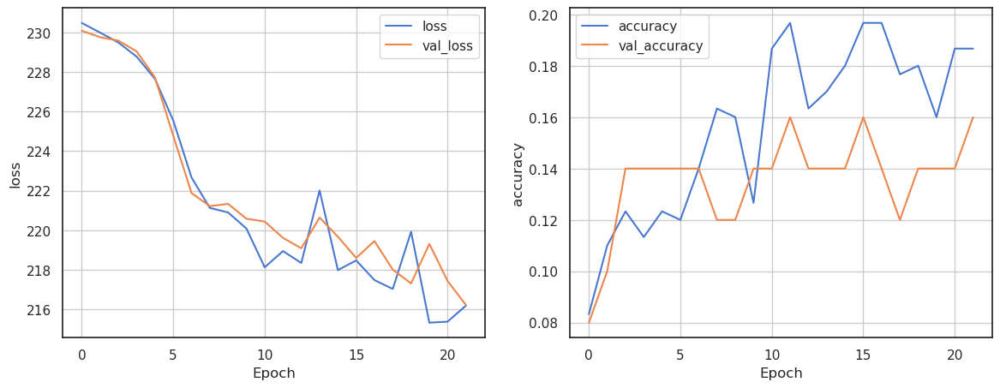

2023-08-30 12:30:28.855927: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:28.859827: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:28.863669: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:28.866783: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:28.869764: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:28.872533: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:28.875327: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:28.878900: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:28.882899: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:28

1/1 [==============================] - 0s 255ms/step - loss: 2.2237 - accuracy: 0.1600


{'loss': 2.223714828491211, 'accuracy': 0.1599999964237213}

1/1 [==============================] - 0s 130ms/step


2023-08-30 12:30:29.214742: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:29.268096: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:29.271831: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:29.272506: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:29.282897: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:29.283607: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:29.296377: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:29.297657: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:29.298410: I tensorflow/core/common_runtime/gpu_fusion_pass.cc:507] ROCm Fusion is enabled.
2023-08-30 12:30:29

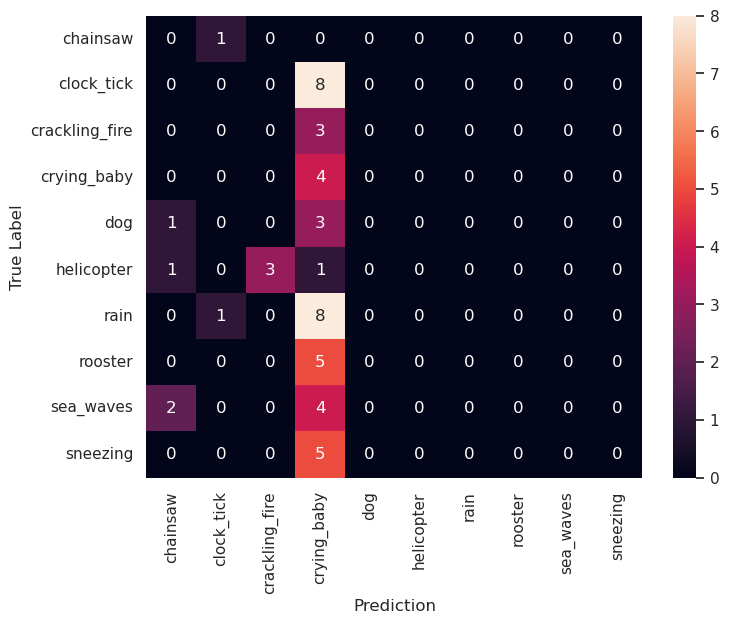

The most misclassified class is crying_baby
Audio category: crying_baby


The are more audio predicted as crying_baby then actually is:
Audio category misclassified as crying_baby: rain


In [ ]:
seed = 42
tf.random.set_seed(seed)

path_to_ESC10 = os.path.join(main_dir, "Data", "ESC-10-depth")

# create the dataset
batch_size = 80
preprocessing = None
train, val, test, label_names, INPUT_DIM, n_labels = create_dataset(
    path_to_ESC10,
    batch_size=batch_size,  # batch size
    preprocessing=preprocessing,
    verbose=0,
    show_example_batch=True,
    ndim=2,
)

# build the model with the best parameters
best_params = {"activation": "elu", "learning_rate": 0.01, "n_units": 8}
model = build_model(n_labels=n_labels, compile=False, **best_params)
learning_rate = best_params["learning_rate"]
epochs = 100
patience = 10
optimizer = (
    tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate)
    if sys.platform == "darwin" or in_colab
    else tf.keras.optimizers.Adam(learning_rate=learning_rate)
)
model, history, confusion_mtx, evaluation = compile_fit_evaluate(
    df_ESC10,
    model,
    train,
    val,
    test,
    label_names,
    epochs=epochs,
    patience=patience,
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    optimizer=optimizer,
    metrics=["accuracy"],
    verbose=0,
    show_history=True,
    show_test_evaluation=True,
    show_confusion_matrix=True,
    listen_to_wrong=True,
)

In [ ]:
# model path
model_path = os.path.join(main_dir, "Saved_Models", Classifier_name)

# save the model
with open(model_path, "wb") as f:
    pickle.dump(model, f)

## 4.2 Classification on encoded spectrograms - RNN

### Short Time Fourier Transform

#### Create dataset

In [66]:
batch_size = 30
preprocessing = "STFT"
n_dim = 3

dataset_STFT, label_STFT = create_dataset_lite(
    df_ESC10,
    batch_size=batch_size,
    preprocessing=preprocessing,
    ndim=n_dim,
    resize=True,
)

INPUT_DIM, n_labels = example_batch(
    dataset_STFT, label_names=list(label_STFT.columns), verbose=0, show_figure=True
)

Preprocessing: STFT
Resizing with shape: 64x128
The max value is 80.0


2023-09-09 20:56:17.789024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:56:17.789167: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:56:17.859381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400

#### Load the encoders and build the model

We trained 2 AEs to produce a flatten code. On these code we are going to train a RNN classifier.

In [67]:
AE_STFT = "AE_Conv_prep_flatten_STFT"

path_to_AE = os.path.join(main_dir, "Saved_Models", AE_STFT)

# import the autencoder
autoencoder = load_model(path_to_AE)
encoder = autoencoder.layers[1]

# freeze the encoder
encoder.trainable = False
encoder.summary()

Classifier_name = "encoder_classifier_flat_code_STFT"

Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 21, 42, 16)        160       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 14, 16)        0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 1568)              0         
                                                                 
 dense_2 (Dense)             (None, 32)                50208     
                                                                 
Total params: 50,368
Trainable params: 0
Non-trainable params: 50,368
_________________________________________________________________


In [68]:
def build_model(
    encoder=encoder,
    INPUT_DIM=INPUT_DIM,
    n_labels=n_labels,
    n_units=8,
    activation="tanh",
    n_hidden_layers=1,
    # arguments to compile the model
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
    learning_rate=1e-3,
    metrics=["accuracy"],
    verbose=0,
    compile=True,
):

    # Define Simple RNN  model
    classifier = tf.keras.Sequential(name="classifier")
    if n_hidden_layers > 0:
        for i in range(1, n_hidden_layers):
            classifier.add(
                tf.keras.layers.GRU(
                    units=n_units * (i + 1),
                    activation=activation,
                    return_sequences=True if i < n_hidden_layers - 1 else False,
                )
            )
    classifier.add(tf.keras.layers.Flatten())
    classifier.add(
        tf.keras.layers.Dense(n_labels, activation="softmax", name="Final_dense")
    )

    # build the model with keras.Model
    inp = tf.keras.Input(shape=INPUT_DIM)
    code = encoder(inp)
    # add 1 dimension to the code
    code = tf.expand_dims(code, axis=1)
    output = classifier(code)
    model = tf.keras.Model(inputs=inp, outputs=output, name=Classifier_name)

    # compile the autoencoder
    lr = learning_rate
    optimizer = (
        tf.keras.optimizers.legacy.Adam(learning_rate=lr)
        if sys.platform == "darwin" or in_colab
        else tf.keras.optimizers.Adam(learning_rate=lr)
    )

    if compile:
        # compile the model
        model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
        if verbose > 0:
            display(model.summary())

    return model

In [69]:
# model = build_model(encoder = encoder_list[0] , n_hidden_layers = 5 )
model = build_model(n_hidden_layers=5)

display(model.summary(line_length=100))
display(model.layers[1].summary(line_length=100))
display(model.layers[3].summary(line_length=100))

2023-09-09 20:56:22.801275: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-09-09 20:56:22.801833: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-09-09 20:56:22.802290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Model: "encoder_classifier_flat_code_STFT"
____________________________________________________________________________________________________
 Layer (type)                                Output Shape                            Param #        
 input_20 (InputLayer)                       [(None, 64, 128, 1)]                    0              
                                                                                                    
 Encoder (Sequential)                        (None, 32)                              50368          
                                                                                                    
 tf.expand_dims_14 (TFOpLambda)              (None, 1, 32)                           0              
                                                                                                    
 classifier (Sequential)                     (None, 10)                              20282          
                                                

2023-09-09 20:56:23.270070: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-09-09 20:56:23.270520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-09-09 20:56:23.270915: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

None

Model: "Encoder"
____________________________________________________________________________________________________
 Layer (type)                                Output Shape                            Param #        
 conv2d_1 (Conv2D)                           (None, 21, 42, 16)                      160            
                                                                                                    
 max_pooling2d_1 (MaxPooling2D)              (None, 7, 14, 16)                       0              
                                                                                                    
 flatten_1 (Flatten)                         (None, 1568)                            0              
                                                                                                    
 dense_2 (Dense)                             (None, 32)                              50208          
                                                                          

None

Model: "classifier"
____________________________________________________________________________________________________
 Layer (type)                                Output Shape                            Param #        
 gru_49 (GRU)                                (None, 1, 16)                           2400           
                                                                                                    
 gru_50 (GRU)                                (None, 1, 24)                           3024           
                                                                                                    
 gru_51 (GRU)                                (None, 1, 32)                           5568           
                                                                                                    
 gru_52 (GRU)                                (None, 40)                              8880           
                                                                       

None

#### Run a Grid Search to find the best hyperparameters

In [7]:
# params = {'n_hidden_layers':[2,4]}
params = {
    "learning_rate": [1e-2, 1e-3, 1e-4],
    "n_units": [8, 32, 128],
    "activation": ["relu", "elu", "tanh"],
    "n_hidden_layers": [1, 2, 3, 4],
}
epochs = 1 if not strong_pc else 50
patience = 10
verbose = 0
K_fold = 5

model_cv, result, best_params = K_fold_training(
    dataset_STFT,
    build_model,
    params=params,
    epochs=epochs,
    patience=patience,
    verbose=verbose,
    K=K_fold,
)

(400, 64, 128, 1)
(400, 10)
accuracy on test for this fold is 0.3
accuracy on test for this fold is 0.3625
accuracy on test for this fold is 0.375
accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.3
accuracy on test for this fold is 0.3375
accuracy on test for this fold is 0.2375
accuracy on test for this fold is 0.3375
accuracy on test for this fold is 0.275
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.3625
accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.1625


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.1125


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.1875


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.1875


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.3
accuracy on test for this fold is 0.3
accuracy on test for this fold is 0.175
accuracy on test for this fold is 0.075
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.225
accuracy on test for this fold is 0.225
accuracy on test for this fold is 0.075
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.0375
accuracy on test for this fold is 0.275
accuracy on test for this fold is 0.15
accuracy on test for this fold is 0.2
accuracy on test for this fold is 0.1625
accuracy on test for this fold is 0.175
accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.1125


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.1125


accuracy on test for this fold is 0.1375


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.225


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.5


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.475


accuracy on test for this fold is 0.4875


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.525


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.4875


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4875


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.5


accuracy on test for this fold is 0.4875
accuracy on test for this fold is 0.425
accuracy on test for this fold is 0.05
accuracy on test for this fold is 0.0875
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.175
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.1125
accuracy on test for this fold is 0.0875
accuracy on test for this fold is 0.1625
accuracy on test for this fold is 0.0375
accuracy on test for this fold is 0.0375
accuracy on test for this fold is 0.0875
accuracy on test for this fold is 0.0625
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.15


accuracy on test for this fold is 0.0375


accuracy on test for this fold is 0.1625


accuracy on test for this fold is 0.075


accuracy on test for this fold is 0.125


accuracy on test for this fold is 0.0875


accuracy on test for this fold is 0.1125


accuracy on test for this fold is 0.175


accuracy on test for this fold is 0.0625


accuracy on test for this fold is 0.0875


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.4875


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.0625


accuracy on test for this fold is 0.175


accuracy on test for this fold is 0.025


accuracy on test for this fold is 0.1375


accuracy on test for this fold is 0.125


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.475


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.55


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.0875


accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.125


accuracy on test for this fold is 0.125


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.525
accuracy on test for this fold is 0.4375
accuracy on test for this fold is 0.375
accuracy on test for this fold is 0.375
accuracy on test for this fold is 0.3
accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.2625
accuracy on test for this fold is 0.3125
accuracy on test for this fold is 0.2875
accuracy on test for this fold is 0.3875
accuracy on test for this fold is 0.2375
accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.3
accuracy on test for this fold is 0.25
accuracy on test for this fold is 0.275
accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.4875


accuracy on test for this fold is 0.2125


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.3125


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.3125


accuracy on test for this fold is 0.225


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.2125
accuracy on test for this fold is 0.1375
accuracy on test for this fold is 0.125
accuracy on test for this fold is 0.1875
accuracy on test for this fold is 0.0625
accuracy on test for this fold is 0.2375
accuracy on test for this fold is 0.175
accuracy on test for this fold is 0.225
accuracy on test for this fold is 0.3375
accuracy on test for this fold is 0.25
accuracy on test for this fold is 0.2625
accuracy on test for this fold is 0.2625
accuracy on test for this fold is 0.1125
accuracy on test for this fold is 0.1375


accuracy on test for this fold is 0.075


accuracy on test for this fold is 0.1125


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.1125


accuracy on test for this fold is 0.15


accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.3125


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.5125


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.5


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.5


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.475


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.4375
accuracy on test for this fold is 0.425
accuracy on test for this fold is 0.0375
accuracy on test for this fold is 0.0875
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.0875
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.1625
accuracy on test for this fold is 0.0625
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.0375
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.1125
accuracy on test for this fold is 0.1125
accuracy on test for this fold is 0.05


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.0875


accuracy on test for this fold is 0.225


accuracy on test for this fold is 0.0875


accuracy on test for this fold is 0.0875


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.1625


accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.175


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.075


accuracy on test for this fold is 0.0625


accuracy on test for this fold is 0.05


accuracy on test for this fold is 0.1375


accuracy on test for this fold is 0.1375


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.5125


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.2125


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.0875


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.3125


accuracy on test for this fold is 0.4875


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4875
accuracy on test for this fold is 0.5125
accuracy on test for this fold is 0.3
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.275
accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.35
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.35
accuracy on test for this fold is 0.45
accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.3625
accuracy on test for this fold is 0.3
accuracy on test for this fold is 0.2875
accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.3875
accuracy on test for this fold is 0.3125
accuracy on test for this fold is 0.2375
accuracy on test for this fold is 0.2
accuracy on test for this fold is 0.1875
accuracy on test for this fold is 0.2
accuracy on test for this fold is 0.2125
accuracy on test for this fold is 0.15
accuracy on test for this fold is 0.1875
accuracy on test for this fold is 0.175
accura

,mean_accuracy
"{'activation': 'tanh', 'learning_rate': 0.0001, 'n_hidden_layers': 4, 'n_units': 128}",0.4925
"{'activation': 'tanh', 'learning_rate': 0.0001, 'n_hidden_layers': 3, 'n_units': 128}",0.4900
"{'activation': 'tanh', 'learning_rate': 0.001, 'n_hidden_layers': 3, 'n_units': 32}",0.4725
"{'activation': 'relu', 'learning_rate': 0.001, 'n_hidden_layers': 4, 'n_units': 128}",0.4650
"{'activation': 'relu', 'learning_rate': 0.0001, 'n_hidden_layers': 3, 'n_units': 128}",0.4625
...,...
"{'activation': 'elu', 'learning_rate': 0.0001, 'n_hidden_layers': 1, 'n_units': 128}",0.0950
"{'activation': 'elu', 'learning_rate': 0.0001, 'n_hidden_layers': 1, 'n_units': 32}",0.0925
"{'activation': 'elu', 'learning_rate': 0.0001, 'n_hidden_layers': 3, 'n_units': 8}",0.0925
"{'activation': 'relu', 'learning_rate': 0.0001, 'n_hidden_layers': 1, 'n_units': 32}",0.0875


#### Train the model

In [70]:
tf.random.set_seed(seed)

path_to_ESC50 = os.path.join(main_dir, "Data", "ESC-50-depth")

# create the dataset
batch_size = 30
preprocessing = "STFT"
train, val, test, label_names, INPUT_DIM, n_labels = create_dataset(
    path_to_ESC50,
    batch_size=batch_size,  # batch size
    preprocessing=preprocessing,
    verbose=0,
    show_example_batch=True,
    ndim=3,
    resize=True,
)

Found 2000 files belonging to 50 classes.


Using 1500 files for training.
Using 500 files for validation.


2023-09-09 20:56:24.850750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]
	 [[{{node Placeholder/_0}}]]
2023-09-09 20:56:24.850928: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]
2023-09-09 20:56:31.992614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]

2023-09-09 20:56:39.208303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-09-09 20:56:39.208782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-09-09 20:56:39.209201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Model: "encoder_classifier_flat_code_STFT"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(None, 64, 128, 1)]      0         
                                                                 
 Encoder (Sequential)        (None, 32)                50368     
                                                                 
 tf.expand_dims_15 (TFOpLamb  (None, 1, 32)            0         
 da)                                                             
                                                                 
 classifier (Sequential)     (None, 50)                2367282   
                                                                 
Total params: 2,417,650
Trainable params: 2,367,282
Non-trainable params: 50,368
_________________________________________________________________
Epoch 1/50


2023-09-09 20:56:39.673435: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-09-09 20:56:39.674300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-09-09 20:56:39.675034: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

46/50 [==========================>...] - ETA: 0s - loss: 3.9095 - accuracy: 0.0254

2023-09-09 20:56:43.135215: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]
2023-09-09 20:56:43.135466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_20' with dtype float
	 [[{{node Placeholder/_20}}]]
2023-09-09 20:56:43.258591: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32


50/50 [==============================] - 5s 47ms/step - loss: 3.9086 - accuracy: 0.0260 - val_loss: 3.9009 - val_accuracy: 0.0160
Epoch 2/50
50/50 [==============================] - 0s 10ms/step - loss: 3.8740 - accuracy: 0.0500 - val_loss: 3.8578 - val_accuracy: 0.0280
Epoch 3/50
50/50 [==============================] - 1s 10ms/step - loss: 3.7829 - accuracy: 0.0487 - val_loss: 3.7487 - val_accuracy: 0.0480
Epoch 4/50
50/50 [==============================] - 0s 10ms/step - loss: 3.6241 - accuracy: 0.0573 - val_loss: 3.6657 - val_accuracy: 0.0520
Epoch 5/50
50/50 [==============================] - 0s 10ms/step - loss: 3.5333 - accuracy: 0.0660 - val_loss: 3.6120 - val_accuracy: 0.0560
Epoch 6/50
50/50 [==============================] - 1s 12ms/step - loss: 3.4719 - accuracy: 0.0880 - val_loss: 3.5680 - val_accuracy: 0.0600
Epoch 7/50
50/50 [==============================] - 1s 10ms/step - loss: 3.4254 - accuracy: 0.0940 - val_loss: 3.5262 - val_accuracy: 0.0840
Epoch 8/50
50/50 [======

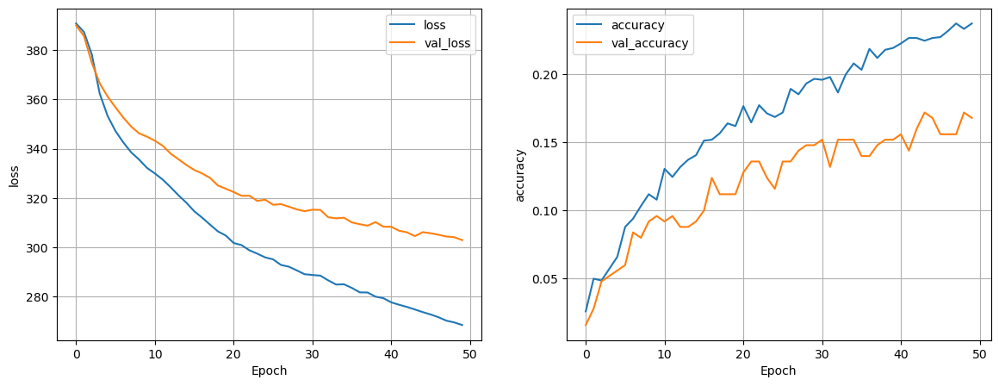

2023-09-09 20:57:11.558341: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_20' with dtype float
	 [[{{node Placeholder/_20}}]]
2023-09-09 20:57:11.558621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_20' with dtype float
	 [[{{node Placeholder/_20}}]]


9/9 [==============================] - 1s 146ms/step - loss: 2.9354 - accuracy: 0.2120


{'loss': 2.935357093811035, 'accuracy': 0.21199999749660492}

2023-09-09 20:57:13.064910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-09-09 20:57:13.065377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-09-09 20:57:13.066191: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

9/9 [==============================] - 0s 5ms/step


2023-09-09 20:57:13.479922: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]
2023-09-09 20:57:13.480174: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]


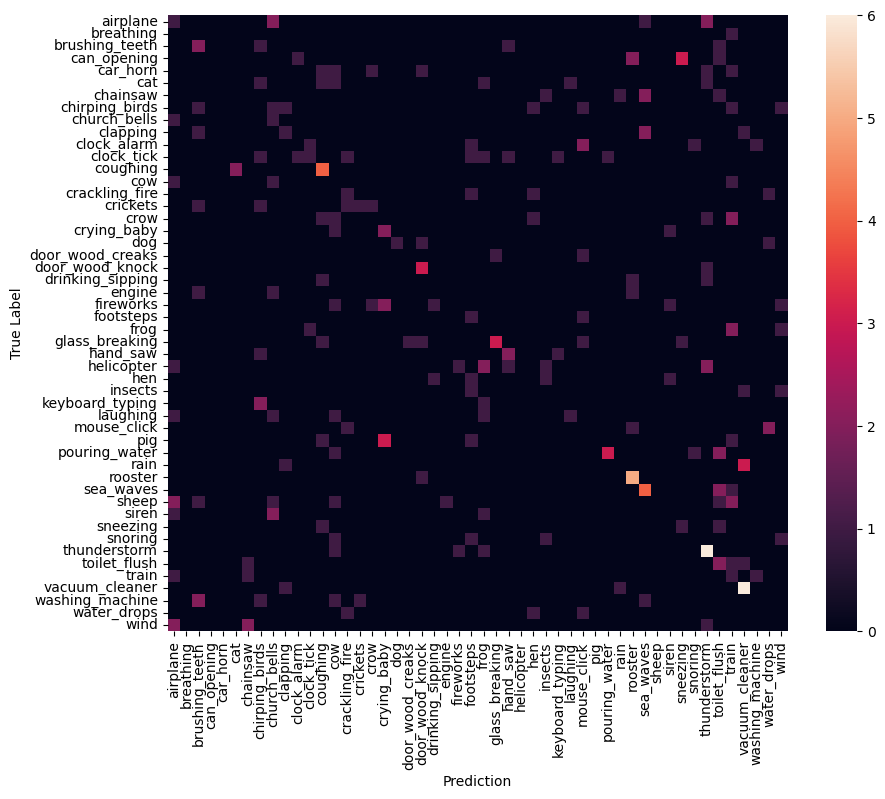

In [71]:
# build the model with the best parameters
best_params = {
    "activation": "tanh",
    "learning_rate": 0.0001,
    "n_hidden_layers": 4,
    "n_units": 128,
}
model = build_model(n_labels=n_labels, compile=False, **best_params)
learning_rate = best_params["learning_rate"]
epochs = 50
patience = 20
optimizer = (
    tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate)
    if sys.platform == "darwin" or in_colab
    else tf.keras.optimizers.Adam(learning_rate=learning_rate)
)
model, history, confusion_mtx, evaluation = compile_fit_evaluate(
    df_ESC50,
    model,
    train,
    val,
    test,
    label_names,
    epochs=epochs,
    patience=patience,
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
    optimizer=optimizer,
    metrics=["accuracy"],
    verbose=1,
    show_history=True,
    show_test_evaluation=True,
    show_confusion_matrix=True,
    listen_to_wrong=False,
)

In [73]:
# model path
model_path = os.path.join(main_dir, "Saved_Models", Classifier_name)

# save the model
with open(model_path, "wb") as f:
    pickle.dump(model, f)

2023-09-09 20:57:46.922978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-09-09 20:57:46.923623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-09-09 20:57:46.924241: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

INFO:tensorflow:Assets written to: ram://c2d0032948874a918cd3f543021288e0/assets


INFO:tensorflow:Assets written to: ram://c2d0032948874a918cd3f543021288e0/assets


### Mel Frequency Cepstral Coefficients

#### Create the dataset

In [74]:
batch_size = 30
preprocessing = "MFCC"
n_dim = 3

dataset_MFCC, label_MFCC = create_dataset_lite(
    df_ESC10,
    batch_size=batch_size,
    preprocessing=preprocessing,
    ndim=n_dim,
    resize=True,
)

INPUT_DIM, n_labels = example_batch(
    dataset_MFCC, label_names=list(label_MFCC.columns), verbose=0, show_figure=True
)

Preprocessing: MFCC
Resizing with shape: 64x128
The max value is 445.77911376953125


2023-09-09 20:58:55.819945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:58:55.820089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:58:55.980201: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400

#### Load the encoder and build the model

In [75]:
AE_MFCC = "AE_Conv_prep_flatten_MFCC"

path_to_AE = os.path.join(main_dir, "Saved_Models", AE_MFCC)

# import the autencoder
autoencoder = load_model(path_to_AE)
encoder = autoencoder.layers[1]

# freeze the encoder
encoder.trainable = False
encoder.summary()

Classifier_name = "encoder_classifier_flat_code_MFCC"

Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 32, 64, 16)        160       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 11, 22, 16)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 6, 11, 32)         4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 2, 4, 32)         0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 1, 2, 48)          13872     
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 1, 1, 48)         0   

In [76]:
INPUT_DIM = (64, 128, 1)


def build_model(
    encoder=encoder,
    INPUT_DIM=INPUT_DIM,
    n_labels=n_labels,
    n_units=8,
    activation="tanh",
    n_hidden_layers=1,
    # arguments to compile the model
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
    learning_rate=1e-3,
    metrics=["accuracy"],
    verbose=0,
    compile=True,
):

    # Define Simple RNN  model
    classifier = tf.keras.Sequential(name="classifier")
    if n_hidden_layers > 0:
        for i in range(1, n_hidden_layers):
            classifier.add(
                tf.keras.layers.GRU(
                    units=n_units * (i + 1),
                    activation=activation,
                    return_sequences=True if i < n_hidden_layers - 1 else False,
                )
            )
    classifier.add(tf.keras.layers.Flatten())
    classifier.add(
        tf.keras.layers.Dense(n_labels, activation="softmax", name="Final_dense")
    )

    # build the model with keras.Model
    inp = tf.keras.Input(shape=INPUT_DIM)
    code = encoder(inp)
    # add 1 dimension to the code
    code = tf.expand_dims(code, axis=1)
    output = classifier(code)
    model = tf.keras.Model(inputs=inp, outputs=output, name=Classifier_name)

    # compile the autoencoder
    lr = learning_rate
    optimizer = (
        tf.keras.optimizers.legacy.Adam(learning_rate=lr)
        if sys.platform == "darwin" or in_colab
        else tf.keras.optimizers.Adam(learning_rate=lr)
    )

    if compile:
        # compile the model
        model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
        if verbose > 0:
            display(model.summary())

    return model

In [77]:
# model = build_model(encoder = encoder_list[0] , n_hidden_layers = 5 )
model = build_model(n_hidden_layers=5)

display(model.summary(line_length=100))
display(model.layers[1].summary(line_length=100))
display(model.layers[3].summary(line_length=100))

2023-09-09 20:58:58.638333: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-09-09 20:58:58.638776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-09-09 20:58:58.639356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

Model: "encoder_classifier_flat_code_MFCC"
____________________________________________________________________________________________________
 Layer (type)                                Output Shape                            Param #        
 input_22 (InputLayer)                       [(None, 64, 128, 1)]                    0              
                                                                                                    
 Encoder (Sequential)                        (None, 32)                              20240          
                                                                                                    
 tf.expand_dims_16 (TFOpLambda)              (None, 1, 32)                           0              
                                                                                                    
 classifier (Sequential)                     (None, 10)                              20282          
                                                

2023-09-09 20:58:59.099427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-09-09 20:58:59.100567: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-09-09 20:58:59.100990: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

None

Model: "Encoder"
____________________________________________________________________________________________________
 Layer (type)                                Output Shape                            Param #        
 conv2d_6 (Conv2D)                           (None, 32, 64, 16)                      160            
                                                                                                    
 max_pooling2d_6 (MaxPooling2D)              (None, 11, 22, 16)                      0              
                                                                                                    
 conv2d_7 (Conv2D)                           (None, 6, 11, 32)                       4640           
                                                                                                    
 max_pooling2d_7 (MaxPooling2D)              (None, 2, 4, 32)                        0              
                                                                          

None

Model: "classifier"
____________________________________________________________________________________________________
 Layer (type)                                Output Shape                            Param #        
 gru_56 (GRU)                                (None, 1, 16)                           2400           
                                                                                                    
 gru_57 (GRU)                                (None, 1, 24)                           3024           
                                                                                                    
 gru_58 (GRU)                                (None, 1, 32)                           5568           
                                                                                                    
 gru_59 (GRU)                                (None, 40)                              8880           
                                                                       

None

#### Run a grid search to find the best params

In [14]:
# params = {'n_hidden_layers':[2,4]}
params = {
    "learning_rate": [1e-2, 1e-3, 1e-4],
    "n_units": [8, 32, 128],
    "activation": ["relu", "elu", "tanh"],
    "n_hidden_layers": [1, 2, 3, 4],
}
epochs = 1 if not strong_pc else 50
patience = 10
verbose = 0
K_fold = 5

model_cv, result, best_params = K_fold_training(
    dataset_MFCC,
    build_model,
    params=params,
    epochs=epochs,
    patience=patience,
    verbose=verbose,
    K=K_fold,
)

(400, 64, 128, 1)
(400, 10)
accuracy on test for this fold is 0.45
accuracy on test for this fold is 0.4125
accuracy on test for this fold is 0.4125
accuracy on test for this fold is 0.425
accuracy on test for this fold is 0.35
accuracy on test for this fold is 0.4625
accuracy on test for this fold is 0.4375
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.4125
accuracy on test for this fold is 0.3125
accuracy on test for this fold is 0.475
accuracy on test for this fold is 0.45
accuracy on test for this fold is 0.4125
accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.4875


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.3125


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.4875


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4875


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.475


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.3125


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.5


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4125
accuracy on test for this fold is 0.3375
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.25
accuracy on test for this fold is 0.2125
accuracy on test for this fold is 0.3
accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.275
accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.425
accuracy on test for this fold is 0.225
accuracy on test for this fold is 0.3875
accuracy on test for this fold is 0.2375
accuracy on test for this fold is 0.275
accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.3125


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.475


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.175


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4125
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.125
accuracy on test for this fold is 0.1125
accuracy on test for this fold is 0.225
accuracy on test for this fold is 0.1375
accuracy on test for this fold is 0.1125
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.0375
accuracy on test for this fold is 0.0875
accuracy on test for this fold is 0.1375
accuracy on test for this fold is 0.2
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.075
accuracy on test for this fold is 0.125
accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.1125


accuracy on test for this fold is 0.1875


accuracy on test for this fold is 0.1625


accuracy on test for this fold is 0.1625


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.15


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.15


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.225


accuracy on test for this fold is 0.225


accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.225


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.1375


accuracy on test for this fold is 0.225


accuracy on test for this fold is 0.175


accuracy on test for this fold is 0.125


accuracy on test for this fold is 0.1625


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.2375


accuracy on test for this fold is 0.225


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.2375
accuracy on test for this fold is 0.275
accuracy on test for this fold is 0.45
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.375
accuracy on test for this fold is 0.425
accuracy on test for this fold is 0.2875
accuracy on test for this fold is 0.45
accuracy on test for this fold is 0.4125
accuracy on test for this fold is 0.3875
accuracy on test for this fold is 0.3875
accuracy on test for this fold is 0.3375
accuracy on test for this fold is 0.45
accuracy on test for this fold is 0.4125
accuracy on test for this fold is 0.3875
accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.4875


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.4875


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.5


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.425


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.3875
accuracy on test for this fold is 0.35
accuracy on test for this fold is 0.3625
accuracy on test for this fold is 0.3625
accuracy on test for this fold is 0.3875
accuracy on test for this fold is 0.35
accuracy on test for this fold is 0.25
accuracy on test for this fold is 0.375
accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.2875
accuracy on test for this fold is 0.2625
accuracy on test for this fold is 0.275
accuracy on test for this fold is 0.4125
accuracy on test for this fold is 0.3125
accuracy on test for this fold is 0.3
accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.475


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.4125


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.5125


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4625


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.2875


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.5


accuracy on test for this fold is 0.4375


accuracy on test for this fold is 0.4875


accuracy on test for this fold is 0.3875


accuracy on test for this fold is 0.45


accuracy on test for this fold is 0.475
accuracy on test for this fold is 0.4625
accuracy on test for this fold is 0.0875
accuracy on test for this fold is 0.1125
accuracy on test for this fold is 0.1625
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.075
accuracy on test for this fold is 0.1375
accuracy on test for this fold is 0.1625
accuracy on test for this fold is 0.0875
accuracy on test for this fold is 0.1
accuracy on test for this fold is 0.1625
accuracy on test for this fold is 0.0875


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.2125


accuracy on test for this fold is 0.1


accuracy on test for this fold is 0.225


accuracy on test for this fold is 0.1125


accuracy on test for this fold is 0.1875


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.1625


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.2


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.15


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.275


accuracy on test for this fold is 0.3625


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.325


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.4


accuracy on test for this fold is 0.3375


accuracy on test for this fold is 0.35


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.2125


accuracy on test for this fold is 0.225


accuracy on test for this fold is 0.2125


accuracy on test for this fold is 0.2125


accuracy on test for this fold is 0.1375


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.25


accuracy on test for this fold is 0.2125


accuracy on test for this fold is 0.2625


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.375


accuracy on test for this fold is 0.3


accuracy on test for this fold is 0.25
accuracy on test for this fold is 0.275
accuracy on test for this fold is 0.4375
accuracy on test for this fold is 0.4375
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.3625
accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.475
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.4125
accuracy on test for this fold is 0.425
accuracy on test for this fold is 0.3625
accuracy on test for this fold is 0.4625
accuracy on test for this fold is 0.4125
accuracy on test for this fold is 0.35
accuracy on test for this fold is 0.3875
accuracy on test for this fold is 0.3375
accuracy on test for this fold is 0.4875
accuracy on test for this fold is 0.4375
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.425
accuracy on test for this fold is 0.3875
accuracy on test for this fold is 0.5
accuracy on test for this fold is 0.4375
accuracy on test for this fold is 0.3

,mean_accuracy
"{'activation': 'elu', 'learning_rate': 0.001, 'n_hidden_layers': 4, 'n_units': 128}",0.4525
"{'activation': 'elu', 'learning_rate': 0.001, 'n_hidden_layers': 4, 'n_units': 32}",0.4450
"{'activation': 'tanh', 'learning_rate': 0.001, 'n_hidden_layers': 3, 'n_units': 32}",0.4425
"{'activation': 'elu', 'learning_rate': 0.001, 'n_hidden_layers': 3, 'n_units': 128}",0.4425
"{'activation': 'relu', 'learning_rate': 0.001, 'n_hidden_layers': 3, 'n_units': 128}",0.4400
...,...
"{'activation': 'relu', 'learning_rate': 0.0001, 'n_hidden_layers': 1, 'n_units': 32}",0.1125
"{'activation': 'elu', 'learning_rate': 0.0001, 'n_hidden_layers': 1, 'n_units': 8}",0.1125
"{'activation': 'tanh', 'learning_rate': 0.0001, 'n_hidden_layers': 1, 'n_units': 128}",0.1100
"{'activation': 'elu', 'learning_rate': 0.0001, 'n_hidden_layers': 1, 'n_units': 128}",0.1075


#### Train the model

In [78]:
seed = 42
tf.random.set_seed(seed)

path_to_ESC50 = os.path.join(main_dir, "Data", "ESC-50-depth")

# create the dataset
batch_size = 30
preprocessing = "MFCC"
train, val, test, label_names, INPUT_DIM, n_labels = create_dataset(
    path_to_ESC50,
    batch_size=batch_size,  # batch size
    preprocessing=preprocessing,
    verbose=0,
    show_example_batch=True,
    ndim=3,
    resize=True,
)

Found 2000 files belonging to 50 classes.


Using 1500 files for training.
Using 500 files for validation.


2023-09-09 20:59:00.395273: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]
2023-09-09 20:59:00.395454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]
2023-09-09 20:59:25.443243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]


Model: "encoder_classifier_flat_code_MFCC"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_23 (InputLayer)       [(None, 64, 128, 1)]      0         
                                                                 
 Encoder (Sequential)        (None, 32)                20240     
                                                                 
 tf.expand_dims_17 (TFOpLamb  (None, 1, 32)            0         
 da)                                                             
                                                                 
 classifier (Sequential)     (None, 50)                2367282   
                                                                 
Total params: 2,387,522
Trainable params: 2,367,282
Non-trainable params: 20,240
_________________________________________________________________
Epoch 1/50


2023-09-09 20:59:50.868116: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_22' with dtype float
	 [[{{node Placeholder/_22}}]]
2023-09-09 20:59:50.868427: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_22' with dtype float
	 [[{{node Placeholder/_22}}]]


46/50 [==========================>...] - ETA: 0s - loss: 3.9139 - accuracy: 0.0261

2023-09-09 20:59:53.621361: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]
2023-09-09 20:59:53.621617: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]


50/50 [==============================] - 7s 103ms/step - loss: 3.9148 - accuracy: 0.0260 - val_loss: 3.9093 - val_accuracy: 0.0080
Epoch 2/50
50/50 [==============================] - 1s 12ms/step - loss: 3.9119 - accuracy: 0.0180 - val_loss: 3.9182 - val_accuracy: 0.0280
Epoch 3/50
50/50 [==============================] - 1s 13ms/step - loss: 3.8824 - accuracy: 0.0260 - val_loss: 3.7937 - val_accuracy: 0.0560
Epoch 4/50
50/50 [==============================] - 1s 12ms/step - loss: 3.6709 - accuracy: 0.0373 - val_loss: 3.6046 - val_accuracy: 0.0440
Epoch 5/50
50/50 [==============================] - 1s 10ms/step - loss: 3.6088 - accuracy: 0.0373 - val_loss: 3.5857 - val_accuracy: 0.0320
Epoch 6/50
50/50 [==============================] - 1s 10ms/step - loss: 3.5431 - accuracy: 0.0433 - val_loss: 3.5728 - val_accuracy: 0.0520
Epoch 7/50
50/50 [==============================] - 1s 11ms/step - loss: 3.5295 - accuracy: 0.0453 - val_loss: 3.6268 - val_accuracy: 0.0480
Epoch 8/50
50/50 [=====

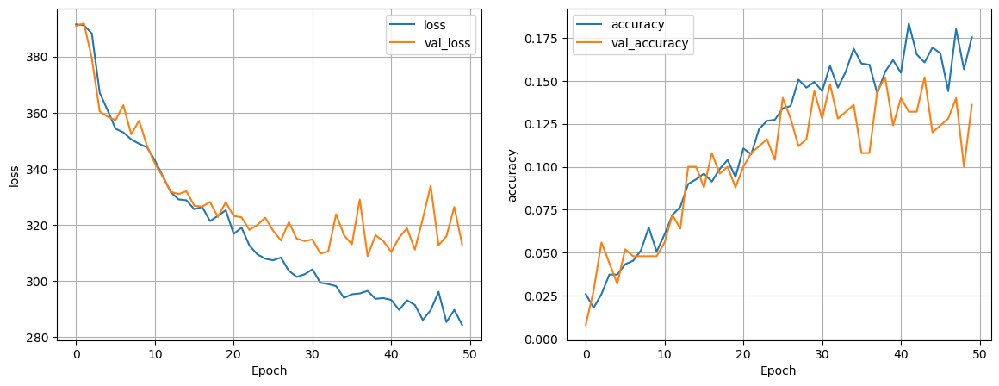

2023-09-09 21:00:26.015571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]
2023-09-09 21:00:26.016166: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]


9/9 [==============================] - 4s 387ms/step - loss: 3.0735 - accuracy: 0.1400


{'loss': 3.0734660625457764, 'accuracy': 0.14000000059604645}

9/9 [==============================] - 0s 5ms/step


2023-09-09 21:00:30.027581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_20' with dtype float
	 [[{{node Placeholder/_20}}]]
2023-09-09 21:00:30.027862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]


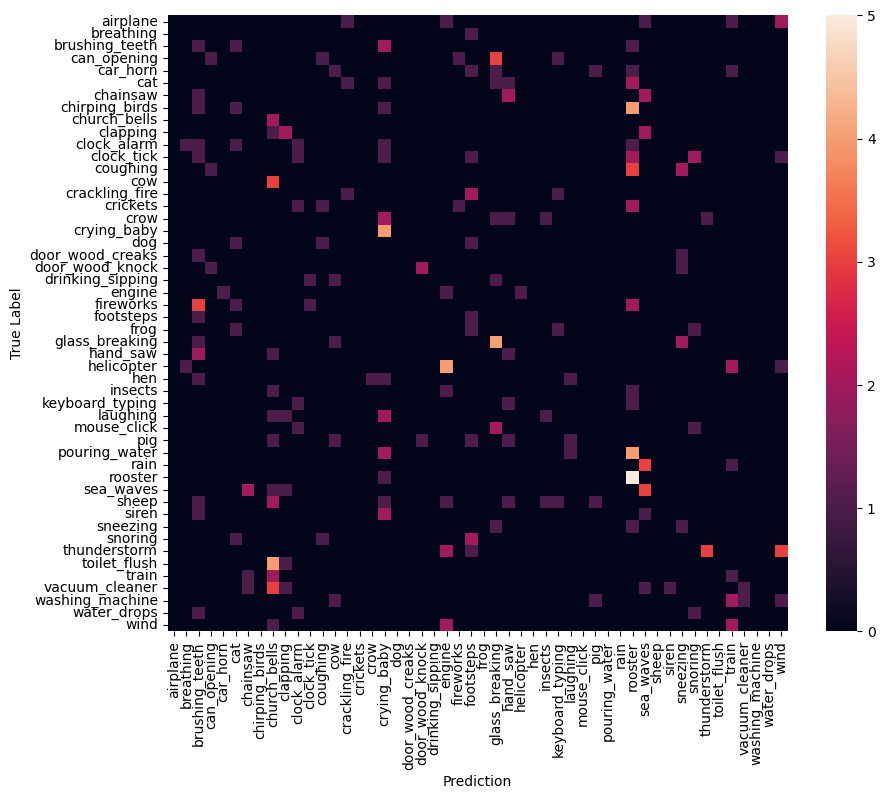

In [79]:
# build the model with the best parameters
best_params = {
    "activation": "elu",
    "learning_rate": 0.001,
    "n_hidden_layers": 4,
    "n_units": 128,
}
model = build_model(n_labels=n_labels, compile=False, **best_params)
learning_rate = best_params["learning_rate"]
epochs = 50
patience = 20
optimizer = (
    tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate)
    if sys.platform == "darwin" or in_colab
    else tf.keras.optimizers.Adam(learning_rate=learning_rate)
)
model, history, confusion_mtx, evaluation = compile_fit_evaluate(
    df_ESC50,
    model,
    train,
    val,
    test,
    label_names,
    epochs=epochs,
    patience=patience,
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    optimizer=optimizer,
    metrics=["accuracy"],
    verbose=1,
    show_history=True,
    show_test_evaluation=True,
    show_confusion_matrix=True,
    listen_to_wrong=False,
)

In [80]:
# model path
model_path = os.path.join(main_dir, "Saved_Models", Classifier_name)

# save the model
with open(model_path, "wb") as f:
    pickle.dump(model, f)

2023-09-09 21:00:30.639105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,32]
	 [[{{node inputs}}]]
2023-09-09 21:00:30.643398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,32]
	 [[{{node inputs}}]]
2023-09-09 21:00:30.712512: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,256]
	 [[{{node inputs}}]]
2023-09-09 2

INFO:tensorflow:Assets written to: ram://7e05049be8e945c2944ac2b8edbe2faf/assets


INFO:tensorflow:Assets written to: ram://7e05049be8e945c2944ac2b8edbe2faf/assets


## 4.3 Classification on encoded spectrograms - CNN

Two out of five autoencoders produce a multichannel code. We kept the number of channels small in order to plot the latent space and avoid having a too big latent space.  

### Short Time Fourier Transform

#### Create dataset

In [81]:
batch_size = 30 if not strong_pc else 128
preprocessing = "STFT"
n_dim = 3

dataset_STFT, label_STFT = create_dataset_lite(
    df_ESC10,
    batch_size=batch_size,
    preprocessing=preprocessing,
    ndim=n_dim,
    resize=True,
)

INPUT_DIM, n_labels = example_batch(
    dataset_STFT, label_names=list(label_STFT.columns), verbose=0, show_figure=True
)

Preprocessing: STFT
Resizing with shape: 64x128
The max value is 80.0


2023-09-09 21:01:25.933039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-09 21:01:25.933188: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-09 21:01:25.988592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400

#### Load the encoders and build the model

In [82]:
AE_STFT = "Fully_Convolutional_AE_STFT"

path_to_AE = os.path.join(main_dir, "Saved_Models", AE_STFT)

# import the autencoder
autoencoder = tf.keras.models.load_model(path_to_AE, compile=False)
encoder = autoencoder.layers[1]

# freeze the encoder
encoder.trainable = False
encoder.summary()

Classifier_name = "encoder_classifier_flat_code_STFT"

Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_37 (Conv2D)          (None, 31, 63, 128)       1280      
                                                                 
 max_pooling2d_33 (MaxPoolin  (None, 15, 31, 128)      0         
 g2D)                                                            
                                                                 
 batch_normalization_55 (Bat  (None, 15, 31, 128)      512       
 chNormalization)                                                
                                                                 
 conv2d_38 (Conv2D)          (None, 7, 15, 6)          6918      
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 3, 7, 6)          0         
 g2D)                                                            
                                                           

In [83]:
INPUT_DIM = (64, 128, 1)


def build_model(
    encoder=encoder,
    INPUT_DIM=INPUT_DIM,
    n_labels=n_labels,
    activation="tanh",
    n_layers=2,
    n_units=4,
    kernel_size=(3, 3),
    strides=(2, 2),
    max_pooling=(1, 1),
    batch_norm=True,
    learning_rate=1e-3,
    # arguments to compile the model
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
    metrics=["accuracy"],
    verbose=0,
    compile=True,
):

    # Define Simple RNN  model
    classifier = tf.keras.Sequential(name="Classifier")
    for i in range(n_layers):
        filters = n_units * (i + 1)
        name = "Conv_layer_" + str(i + 1)
        classifier.add(
            tf.keras.layers.Conv2D(
                filters,
                kernel_size,
                strides=2,
                activation=activation,
                padding="same",
                name=name,
            )
        )
        name = "Max_pooling_layer_" + str(i + 1)
        classifier.add(layers.MaxPool2D(max_pooling, padding="same", name=name))

        if batch_norm:
            name = "Batch_Norm_layer_" + str(i + 1)
            classifier.add(layers.BatchNormalization(name=name))

    # Flatten the output of the previous layer
    classifier.add(tf.keras.layers.Flatten(name="Flatten_layer"))

    # Dense layer for classification
    classifier.add(
        tf.keras.layers.Dense(n_labels, activation="softmax", name="Final_dense")
    )

    # build the model with keras.Model
    inp = tf.keras.Input(shape=INPUT_DIM)
    code = encoder(inp)
    # add 1 dimension to the code
    output = classifier(code)
    model = tf.keras.Model(inputs=inp, outputs=output, name=Classifier_name)

    # compile the autoencoder
    lr = learning_rate
    optimizer = (
        tf.keras.optimizers.legacy.Adam(learning_rate=lr)
        if sys.platform == "darwin" or in_colab
        else tf.keras.optimizers.Adam(learning_rate=lr)
    )

    if compile:
        # compile the model
        model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
        if verbose > 0:
            display(model.summary())

    return model

In [84]:
# model = build_model(encoder = encoder_list[0] , n_hidden_layers = 5 )
model = build_model(kernel_size=(8, 8))

display(model.summary(line_length=100))
display(model.layers[1].summary(line_length=100))
display(model.layers[2].summary(line_length=100))

Model: "encoder_classifier_flat_code_STFT"
____________________________________________________________________________________________________
 Layer (type)                                Output Shape                            Param #        
 input_24 (InputLayer)                       [(None, 64, 128, 1)]                    0              
                                                                                                    
 Encoder (Sequential)                        (None, 3, 7, 6)                         8734           
                                                                                                    
 Classifier (Sequential)                     (None, 10)                              3814           
                                                                                                    
Total params: 12,548
Trainable params: 3,790
Non-trainable params: 8,758
____________________________________________________________________________

None

Model: "Encoder"
____________________________________________________________________________________________________
 Layer (type)                                Output Shape                            Param #        
 conv2d_37 (Conv2D)                          (None, 31, 63, 128)                     1280           
                                                                                                    
 max_pooling2d_33 (MaxPooling2D)             (None, 15, 31, 128)                     0              
                                                                                                    
 batch_normalization_55 (BatchNormalization)  (None, 15, 31, 128)                    512            
                                                                                                    
 conv2d_38 (Conv2D)                          (None, 7, 15, 6)                        6918           
                                                                          

None

Model: "Classifier"
____________________________________________________________________________________________________
 Layer (type)                                Output Shape                            Param #        


 Conv_layer_1 (Conv2D)                       (None, 2, 4, 4)                         1540           
                                                                                                    
 Max_pooling_layer_1 (MaxPooling2D)          (None, 2, 4, 4)                         0              
                                                                                                    
 Batch_Norm_layer_1 (BatchNormalization)     (None, 2, 4, 4)                         16             
                                                                                                    
 Conv_layer_2 (Conv2D)                       (None, 1, 2, 8)                         2056           
                                                                                                    
 Max_pooling_layer_2 (MaxPooling2D)          (None, 1, 2, 8)                         0              
                                                                                           

None

In [85]:
tf.keras.utils.plot_model(
    model,
    expand_nested=True,
    show_shapes=True,
    dpi=100,  # size of the image
)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


#### Run a Grid Search to find the best hyperparameters

In [22]:
# params = {'n_layers':[2,4]}
params = {
    "learning_rate": [1e-2, 1e-3, 1e-4],
    "n_units": [8, 64],
    "activation": ["relu", "elu", "tanh"],
    "n_layers": [1, 2, 3, 4],
    "kernel_size": [(2, 2), (3, 3), (4, 4)],
    "strides": [(1, 1), (2, 2)],
}

epochs = 1 if not strong_pc else 50
patience = 10
verbose = 0
K_fold = 5

model_cv, result, best_params = K_fold_training(
    dataset_STFT,
    build_model,
    params=params,
    epochs=epochs,
    patience=patience,
    verbose=verbose,
    K=K_fold,
)

# 2160 fits with less then 10 seconds each on CPU ---> 5 hours on GPU?

(400, 64, 128, 1)
(400, 10)
accuracy on test for this fold is 0.4875
accuracy on test for this fold is 0.3125
accuracy on test for this fold is 0.4375
accuracy on test for this fold is 0.4375
accuracy on test for this fold is 0.4875
accuracy on test for this fold is 0.3875
accuracy on test for this fold is 0.425
accuracy on test for this fold is 0.3625
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.45
accuracy on test for this fold is 0.475
accuracy on test for this fold is 0.4875
accuracy on test for this fold is 0.3875
accuracy on test for this fold is 0.2875
accuracy on test for this fold is 0.375
accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.3
accuracy on test for this fold is 0.325
accuracy on test for this fold is 0.2875
accuracy on test for this fold is 0.3
accuracy on test for this fold is 0.4125
accuracy on test for this fold is 0.4
accuracy on test for this fold is 0.4125
accuracy o

,mean_accuracy
"{'activation': 'elu', 'kernel_size': (2, 2), 'learning_rate': 0.0001, 'n_layers': 2, 'n_units': 64, 'strides': (2, 2)}",0.5075
"{'activation': 'relu', 'kernel_size': (2, 2), 'learning_rate': 0.0001, 'n_layers': 2, 'n_units': 64, 'strides': (1, 1)}",0.5050
"{'activation': 'relu', 'kernel_size': (2, 2), 'learning_rate': 0.0001, 'n_layers': 3, 'n_units': 64, 'strides': (1, 1)}",0.5025
"{'activation': 'tanh', 'kernel_size': (2, 2), 'learning_rate': 0.001, 'n_layers': 1, 'n_units': 64, 'strides': (2, 2)}",0.5025
"{'activation': 'relu', 'kernel_size': (2, 2), 'learning_rate': 0.001, 'n_layers': 1, 'n_units': 64, 'strides': (2, 2)}",0.5000
...,...
"{'activation': 'tanh', 'kernel_size': (4, 4), 'learning_rate': 0.01, 'n_layers': 4, 'n_units': 64, 'strides': (1, 1)}",0.1000
"{'activation': 'tanh', 'kernel_size': (4, 4), 'learning_rate': 0.01, 'n_layers': 2, 'n_units': 8, 'strides': (2, 2)}",0.1000
"{'activation': 'tanh', 'kernel_size': (4, 4), 'learning_rate': 0.01, 'n_layers': 3, 'n_units': 8, 'strides': (1, 1)}",0.0975
"{'activation': 'tanh', 'kernel_size': (3, 3), 'learning_rate': 0.01, 'n_layers': 3, 'n_units': 8, 'strides': (2, 2)}",0.0975


#### Train the model

In [86]:
tf.random.set_seed(seed)

path_to_ESC50 = os.path.join(main_dir, "Data", "ESC-50-depth")

# create the dataset
batch_size = 30
preprocessing = "STFT"
train, val, test, label_names, INPUT_DIM, n_labels = create_dataset(
    path_to_ESC50,
    batch_size=batch_size,  # batch size
    preprocessing=preprocessing,
    verbose=0,
    show_example_batch=True,
    ndim=3,
    resize=True,
    transpose=False,
)

Found 2000 files belonging to 50 classes.


Using 1500 files for training.
Using 500 files for validation.


2023-09-09 21:01:33.851886: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]
	 [[{{node Placeholder/_0}}]]
2023-09-09 21:01:33.852051: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]
2023-09-09 21:01:41.219523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_22' with dtype float
	 [[{{node Place

Model: "encoder_classifier_flat_code_STFT"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_25 (InputLayer)       [(None, 64, 128, 1)]      0         
                                                                 
 Encoder (Sequential)        (None, 3, 7, 6)           8734      
                                                                 
 Classifier (Sequential)     (None, 50)                48114     
                                                                 
Total params: 56,848
Trainable params: 47,730
Non-trainable params: 9,118
_________________________________________________________________
Epoch 1/50


2023-09-09 21:01:48.292469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_22' with dtype float
	 [[{{node Placeholder/_22}}]]
2023-09-09 21:01:48.292788: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]
	 [[{{node Placeholder/_0}}]]


49/50 [============================>.] - ETA: 0s - loss: 4.1129 - accuracy: 0.0361

2023-09-09 21:01:49.227686: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_20' with dtype float
	 [[{{node Placeholder/_20}}]]
2023-09-09 21:01:49.227954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]


50/50 [==============================] - 3s 46ms/step - loss: 4.1040 - accuracy: 0.0373 - val_loss: 3.7617 - val_accuracy: 0.0520
Epoch 2/50
50/50 [==============================] - 1s 12ms/step - loss: 3.5465 - accuracy: 0.0947 - val_loss: 3.5904 - val_accuracy: 0.0520
Epoch 3/50
50/50 [==============================] - 1s 12ms/step - loss: 3.3104 - accuracy: 0.1447 - val_loss: 3.4683 - val_accuracy: 0.0920
Epoch 4/50
50/50 [==============================] - 1s 13ms/step - loss: 3.1585 - accuracy: 0.1920 - val_loss: 3.3499 - val_accuracy: 0.1200
Epoch 5/50
50/50 [==============================] - 1s 11ms/step - loss: 3.0375 - accuracy: 0.2133 - val_loss: 3.2671 - val_accuracy: 0.1160
Epoch 6/50
50/50 [==============================] - 1s 12ms/step - loss: 2.9339 - accuracy: 0.2467 - val_loss: 3.1751 - val_accuracy: 0.1560
Epoch 7/50
50/50 [==============================] - 1s 11ms/step - loss: 2.8530 - accuracy: 0.2553 - val_loss: 3.1136 - val_accuracy: 0.1800
Epoch 8/50
50/50 [======

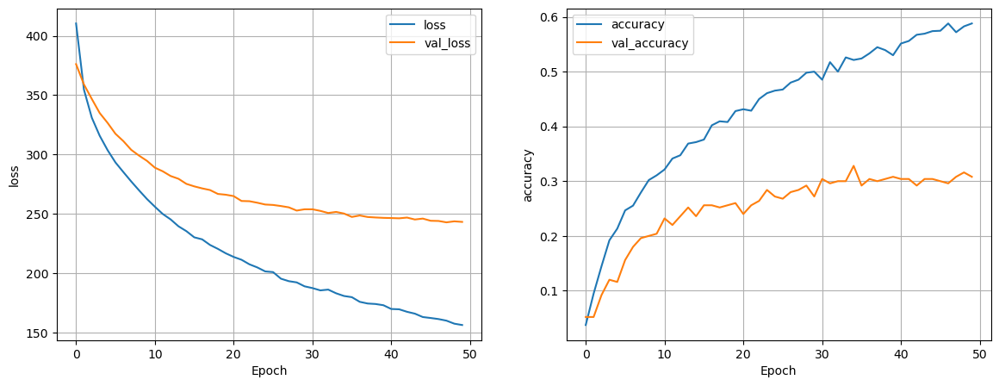

2023-09-09 21:02:19.402026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_20' with dtype float
	 [[{{node Placeholder/_20}}]]
2023-09-09 21:02:19.402304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]


9/9 [==============================] - 1s 142ms/step - loss: 2.4801 - accuracy: 0.3280


{'loss': 2.4800989627838135, 'accuracy': 0.328000009059906}

9/9 [==============================] - 0s 8ms/step


2023-09-09 21:02:20.942244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_20' with dtype float
	 [[{{node Placeholder/_20}}]]
2023-09-09 21:02:20.942496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_20' with dtype float
	 [[{{node Placeholder/_20}}]]


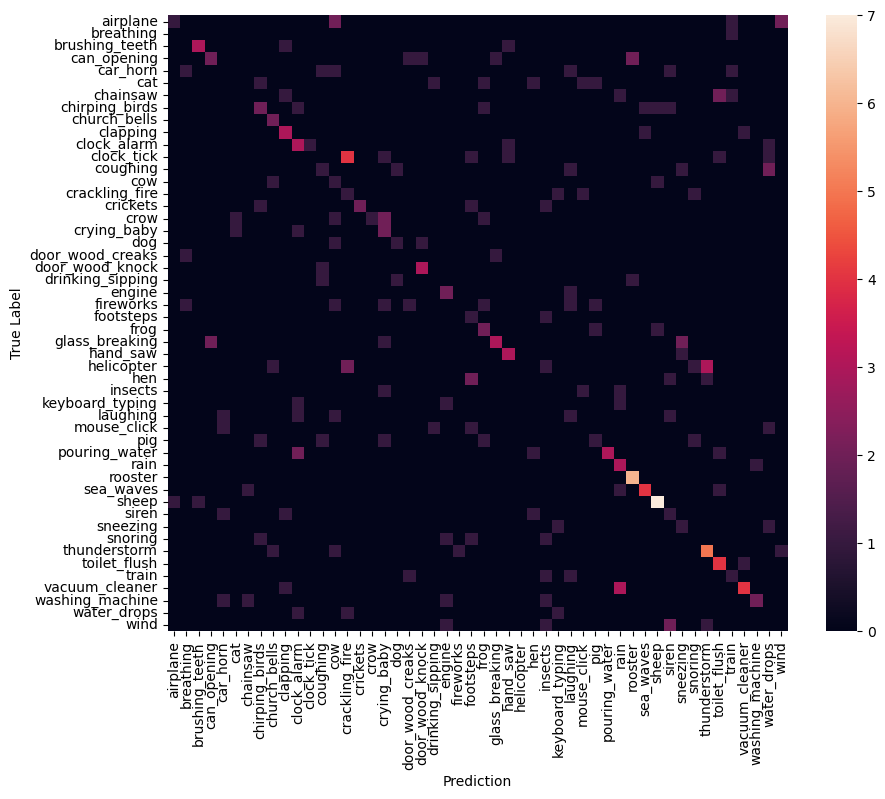

In [87]:
# build the model with the best parameters
best_params = {
    "activation": "elu",
    "kernel_size": (2, 2),
    "learning_rate": 0.0001,
    "n_layers": 2,
    "n_units": 64,
    "strides": (2, 2),
}
model = build_model(n_labels=n_labels, compile=False, **best_params)
learning_rate = best_params["learning_rate"]
epochs = 50
patience = 20
optimizer = (
    tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate)
    if sys.platform == "darwin" or in_colab
    else tf.keras.optimizers.Adam(learning_rate=learning_rate)
)
model, history, confusion_mtx, evaluation = compile_fit_evaluate(
    df_ESC50,
    model,
    train,
    val,
    test,
    label_names,
    epochs=epochs,
    patience=patience,
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
    optimizer=optimizer,
    metrics=["accuracy"],
    verbose=1,
    show_history=True,
    show_test_evaluation=True,
    show_confusion_matrix=True,
    listen_to_wrong=False,
)

In [89]:
# model path
model_path = os.path.join(main_dir, "Saved_Models", Classifier_name)

# save the model
with open(model_path, "wb") as f:
    pickle.dump(model, f)

INFO:tensorflow:Assets written to: ram://b1abaa156e96419eb82f7ecdaeaf0e22/assets


INFO:tensorflow:Assets written to: ram://b1abaa156e96419eb82f7ecdaeaf0e22/assets


### Mel Frequency Cepstral Coefficients

#### Create the dataset

In [91]:
batch_size = 30
preprocessing = "MFCC"
n_dim = 3

dataset_MFCC, label_MFCC = create_dataset_lite(
    df_ESC10,
    batch_size=batch_size,
    preprocessing=preprocessing,
    ndim=n_dim,
    resize=True,
)

INPUT_DIM, n_labels = example_batch(
    dataset_MFCC, label_names=list(label_MFCC.columns), verbose=0, show_figure=True
)

Preprocessing: MFCC
Resizing with shape: 64x128
The max value is 445.77911376953125


2023-09-09 21:03:37.897540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-09 21:03:37.897701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [400,10]
	 [[{{node Placeholder/_1}}]]
2023-09-09 21:03:38.049454: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [40

#### Load the encoder and build the model

In [92]:
AE_MFCC = "Fully_Convolutional_AE_MFCC"

path_to_AE = os.path.join(main_dir, "Saved_Models", AE_MFCC)

# import the autencoder
autoencoder = load_model(path_to_AE)
encoder = autoencoder.layers[1]

# freeze the encoder
encoder.trainable = False
encoder.summary()

Classifier_name = "encoder_classifier_flat_code_MFCC"

Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 31, 63, 16)        160       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 15, 31, 16)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 7, 15, 6)          870       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 3, 7, 6)          0         
 2D)                                                             
                                                                 
Total params: 1,030
Trainable params: 0
Non-trainable params: 1,030
_________________________________________________________________


In [93]:
def build_model(
    encoder=encoder,
    INPUT_DIM=INPUT_DIM,
    n_labels=n_labels,
    activation="tanh",
    n_layers=2,
    n_units=4,
    kernel_size=(3, 3),
    strides=(2, 2),
    max_pooling=(1, 1),
    batch_norm=True,
    learning_rate=1e-3,
    # arguments to compile the model
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
    metrics=["accuracy"],
    verbose=0,
    compile=True,
):

    # Define Simple RNN  model
    classifier = tf.keras.Sequential(name="Classifier")
    for i in range(n_layers):
        filters = n_units * (i + 1)
        name = "Conv_layer_" + str(i + 1)
        classifier.add(
            tf.keras.layers.Conv2D(
                filters,
                kernel_size,
                strides=2,
                activation=activation,
                padding="same",
                name=name,
            )
        )
        name = "Max_pooling_layer_" + str(i + 1)
        classifier.add(layers.MaxPool2D(max_pooling, padding="same", name=name))

        if batch_norm:
            name = "Batch_Norm_layer_" + str(i + 1)
            classifier.add(layers.BatchNormalization(name=name))

    # Flatten the output of the previous layer
    classifier.add(tf.keras.layers.Flatten(name="Flatten_layer"))

    # Dense layer for classification
    classifier.add(
        tf.keras.layers.Dense(n_labels, activation="softmax", name="Final_dense")
    )

    # build the model with keras.Model
    inp = tf.keras.Input(shape=INPUT_DIM)
    code = encoder(inp)
    # add 1 dimension to the code
    output = classifier(code)
    model = tf.keras.Model(inputs=inp, outputs=output, name=Classifier_name)

    # compile the autoencoder
    lr = learning_rate
    optimizer = (
        tf.keras.optimizers.legacy.Adam(learning_rate=lr)
        if sys.platform == "darwin" or in_colab
        else tf.keras.optimizers.Adam(learning_rate=lr)
    )

    if compile:
        # compile the model
        model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
        if verbose > 0:
            display(model.summary())

    return model

In [94]:
# model = build_model(encoder = encoder_list[0] , n_hidden_layers = 5 )
model = build_model(n_layers=4)

display(model.summary(line_length=100))
display(model.layers[1].summary(line_length=100))
display(model.layers[2].summary(line_length=100))

Model: "encoder_classifier_flat_code_MFCC"
____________________________________________________________________________________________________
 Layer (type)                                Output Shape                            Param #        
 input_26 (InputLayer)                       [(None, 64, 128, 1)]                    0              
                                                                                                    
 Encoder (Sequential)                        (None, 3, 7, 6)                         1030           
                                                                                                    
 Classifier (Sequential)                     (None, 10)                              3466           
                                                                                                    
Total params: 4,496
Trainable params: 3,386
Non-trainable params: 1,110
_____________________________________________________________________________

None

Model: "Encoder"
____________________________________________________________________________________________________
 Layer (type)                                Output Shape                            Param #        
 conv2d_4 (Conv2D)                           (None, 31, 63, 16)                      160            
                                                                                                    
 max_pooling2d_4 (MaxPooling2D)              (None, 15, 31, 16)                      0              
                                                                                                    
 conv2d_5 (Conv2D)                           (None, 7, 15, 6)                        870            
                                                                                                    
 max_pooling2d_5 (MaxPooling2D)              (None, 3, 7, 6)                         0              
                                                                          

None

Model: "Classifier"
____________________________________________________________________________________________________
 Layer (type)                                Output Shape                            Param #        
 Conv_layer_1 (Conv2D)                       (None, 2, 4, 4)                         220            
                                                                                                    
 Max_pooling_layer_1 (MaxPooling2D)          (None, 2, 4, 4)                         0              
                                                                                                    
 Batch_Norm_layer_1 (BatchNormalization)     (None, 2, 4, 4)                         16             
                                                                                                    
 Conv_layer_2 (Conv2D)                       (None, 1, 2, 8)                         296            
                                                                       

None

In [95]:
tf.keras.utils.plot_model(
    model,
    expand_nested=True,
    show_shapes=True,
    dpi=100,  # size of the image
)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


#### Run a grid search to find the best params

In [ ]:
# params = {'n_layers':[2,4]}
params = {
    "learning_rate": [1e-2, 1e-3, 1e-4],
    "n_units": [8, 64],
    "activation": ["relu", "elu", "tanh"],
    "n_layers": [1, 2, 3, 4],
    "kernel_size": [(2, 2), (3, 3), (4, 4)],
    "strides": [(1, 1), (2, 2)],
}

epochs = 1 if not strong_pc else 50
patience = 10
verbose = 0
K_fold = 5

model_cv, result, best_params = K_fold_training(
    dataset_MFCC,
    build_model,
    params=params,
    epochs=epochs,
    patience=patience,
    verbose=verbose,
    K=K_fold,
)

(400, 64, 128, 1)
(400, 10)
accuracy on test for this fold is 0.4875
accuracy on test for this fold is 0.4375
accuracy on test for this fold is 0.4375
accuracy on test for this fold is 0.55


accuracy on test for this fold is 0.6


accuracy on test for this fold is 0.425
accuracy on test for this fold is 0.4875
accuracy on test for this fold is 0.4375
accuracy on test for this fold is 0.525
accuracy on test for this fold is 0.55
accuracy on test for this fold is 0.45
accuracy on test for this fold is 0.55
accuracy on test for this fold is 0.5125
accuracy on test for this fold is 0.6
accuracy on test for this fold is 0.525
accuracy on test for this fold is 0.375
accuracy on test for this fold is 0.6
accuracy on test for this fold is 0.475
accuracy on test for this fold is 0.6125
accuracy on test for this fold is 0.4875
accuracy on test for this fold is 0.45
accuracy on test for this fold is 0.425
accuracy on test for this fold is 0.475
accuracy on test for this fold is 0.5
accuracy on test for this fold is 0.575
accuracy on test for this fold is 0.425
accuracy on test for this fold is 0.5875
accuracy on test for this fold is 0.4625
accuracy on test for this fold is 0.5375
accuracy on test for this fold is 0.5625
a

,mean_accuracy
"{'activation': 'relu', 'kernel_size': (4, 4), 'learning_rate': 0.0001, 'n_layers': 2, 'n_units': 64, 'strides': (1, 1)}",0.6025
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.001, 'n_layers': 2, 'n_units': 64, 'strides': (2, 2)}",0.5850
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.0001, 'n_layers': 4, 'n_units': 64, 'strides': (1, 1)}",0.5800
"{'activation': 'elu', 'kernel_size': (4, 4), 'learning_rate': 0.0001, 'n_layers': 4, 'n_units': 64, 'strides': (1, 1)}",0.5800
"{'activation': 'relu', 'kernel_size': (3, 3), 'learning_rate': 0.0001, 'n_layers': 1, 'n_units': 64, 'strides': (2, 2)}",0.5800
...,...
"{'activation': 'elu', 'kernel_size': (2, 2), 'learning_rate': 0.0001, 'n_layers': 1, 'n_units': 8, 'strides': (2, 2)}",0.1825
"{'activation': 'relu', 'kernel_size': (2, 2), 'learning_rate': 0.0001, 'n_layers': 1, 'n_units': 8, 'strides': (1, 1)}",0.1775
"{'activation': 'elu', 'kernel_size': (2, 2), 'learning_rate': 0.0001, 'n_layers': 1, 'n_units': 8, 'strides': (1, 1)}",0.1700
"{'activation': 'relu', 'kernel_size': (2, 2), 'learning_rate': 0.0001, 'n_layers': 1, 'n_units': 8, 'strides': (2, 2)}",0.1575


#### Train the model

In [96]:
seed = 42
tf.random.set_seed(seed)

path_to_ESC50 = os.path.join(main_dir, "Data", "ESC-50-depth")

# create the dataset
batch_size = 30
preprocessing = "MFCC"
train, val, test, label_names, INPUT_DIM, n_labels = create_dataset(
    path_to_ESC50,
    batch_size=batch_size,  # batch size
    preprocessing=preprocessing,
    verbose=0,
    show_example_batch=True,
    ndim=3,
    resize=True,
)

Found 2000 files belonging to 50 classes.


Using 1500 files for training.
Using 500 files for validation.


2023-09-09 21:03:54.642866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]
2023-09-09 21:03:54.643042: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]
2023-09-09 21:04:16.738969: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [1500]


Model: "encoder_classifier_flat_code_MFCC"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_27 (InputLayer)       [(None, 64, 128, 1)]      0         
                                                                 
 Encoder (Sequential)        (None, 3, 7, 6)           1030      
                                                                 
 Classifier (Sequential)     (None, 50)                151026    
                                                                 
Total params: 152,056
Trainable params: 150,642
Non-trainable params: 1,414
_________________________________________________________________


2023-09-09 21:04:37.903896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]
2023-09-09 21:04:37.904208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [1500]
	 [[{{node Placeholder/_4}}]]


Epoch 1/50
49/50 [============================>.] - ETA: 0s - loss: 4.1511 - accuracy: 0.0435

2023-09-09 21:04:38.532162: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]
2023-09-09 21:04:38.532420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]


50/50 [==============================] - 4s 80ms/step - loss: 4.1396 - accuracy: 0.0440 - val_loss: 3.9197 - val_accuracy: 0.0120
Epoch 2/50
50/50 [==============================] - 1s 10ms/step - loss: 3.5585 - accuracy: 0.0873 - val_loss: 3.9304 - val_accuracy: 0.0040
Epoch 3/50
50/50 [==============================] - 0s 7ms/step - loss: 3.3106 - accuracy: 0.1327 - val_loss: 3.9433 - val_accuracy: 0.0080
Epoch 4/50
50/50 [==============================] - 0s 7ms/step - loss: 3.1374 - accuracy: 0.1700 - val_loss: 3.9578 - val_accuracy: 0.0080
Epoch 5/50
50/50 [==============================] - 0s 8ms/step - loss: 3.0050 - accuracy: 0.2027 - val_loss: 3.9657 - val_accuracy: 0.0160
Epoch 6/50
50/50 [==============================] - 0s 7ms/step - loss: 2.9012 - accuracy: 0.2213 - val_loss: 3.9672 - val_accuracy: 0.0200
Epoch 7/50
50/50 [==============================] - 0s 7ms/step - loss: 2.8084 - accuracy: 0.2467 - val_loss: 3.9477 - val_accuracy: 0.0280
Epoch 8/50
50/50 [===========

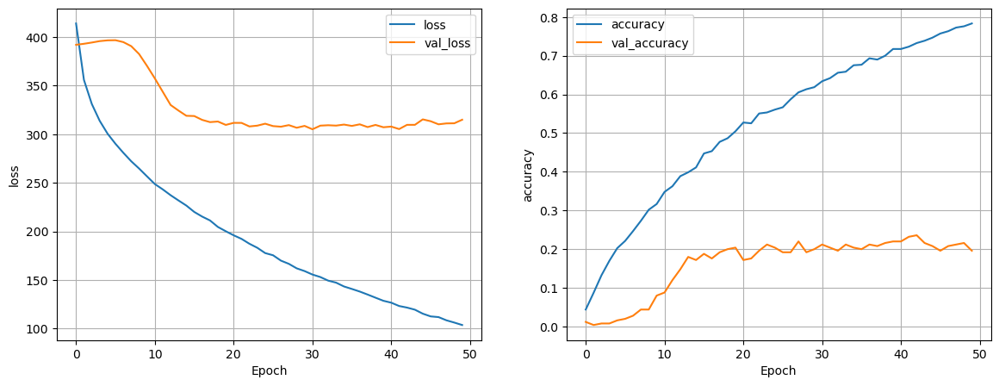

2023-09-09 21:04:58.187571: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [500]
	 [[{{node Placeholder/_0}}]]
2023-09-09 21:04:58.187849: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_20' with dtype float
	 [[{{node Placeholder/_20}}]]


9/9 [==============================] - 4s 392ms/step - loss: 2.9386 - accuracy: 0.2200


{'loss': 2.9386210441589355, 'accuracy': 0.2199999988079071}

9/9 [==============================] - 0s 8ms/step


2023-09-09 21:05:02.050518: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]
2023-09-09 21:05:02.050799: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [500]
	 [[{{node Placeholder/_4}}]]


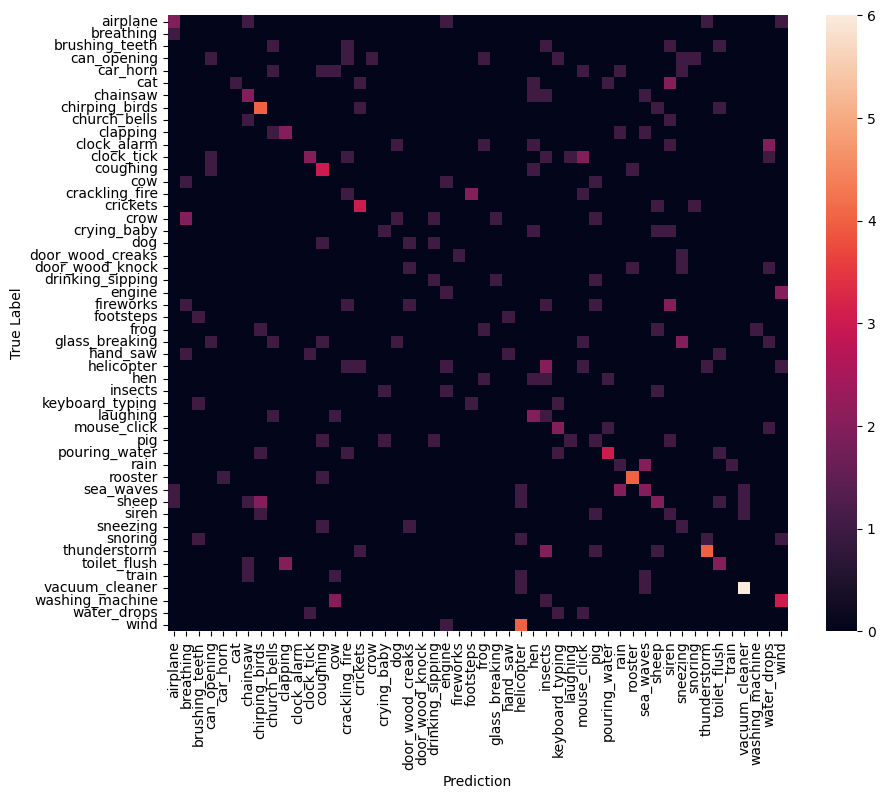

In [97]:
# build the model with the best parameters
best_params = {
    "activation": "relu",
    "kernel_size": (4, 4),
    "learning_rate": 0.0001,
    "n_layers": 2,
    "n_units": 64,
    "strides": (1, 1),
}
model = build_model(n_labels=n_labels, compile=False, **best_params)
learning_rate = best_params["learning_rate"]
epochs = 50
patience = 20
optimizer = (
    tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate)
    if sys.platform == "darwin" or in_colab
    else tf.keras.optimizers.Adam(learning_rate=learning_rate)
)
model, history, confusion_mtx, evaluation = compile_fit_evaluate(
    df_ESC50,
    model,
    train,
    val,
    test,
    label_names,
    epochs=epochs,
    patience=patience,
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    optimizer=optimizer,
    metrics=["accuracy"],
    verbose=1,
    show_history=True,
    show_test_evaluation=True,
    show_confusion_matrix=True,
    listen_to_wrong=False,
)

In [98]:
# model path
model_path = os.path.join(main_dir, "Saved_Models", Classifier_name)

# save the model
with open(model_path, "wb") as f:
    pickle.dump(model, f)

INFO:tensorflow:Assets written to: ram://00b0c60e305c4516ae2b7f1b516774cb/assets


INFO:tensorflow:Assets written to: ram://00b0c60e305c4516ae2b7f1b516774cb/assets


## 4.4 Classification on encoded spectrograms - SVM

As a last attempt, we decided to train an SVM always on the ESC-50 encoded in a latent flatten space.

### STFT input, flatten code

#### Create the dataset

In [33]:
batch_size = 30 if not strong_pc else 128
preprocessing = "STFT"
n_dim = 3

dataset_STFT, label_STFT = create_dataset_lite(
    df_ESC50,
    batch_size=batch_size,
    preprocessing=preprocessing,
    ndim=n_dim,
    resize=True,
)

INPUT_DIM, n_labels = example_batch(
    dataset_STFT, label_names=list(label_STFT.columns), verbose=0, show_figure=True
)

Preprocessing: STFT
Resizing with shape: 64x128
The max value is 80.0


2023-09-09 20:27:07.020991: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:27:07.021157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:27:07.109956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [

#### Load the encoder

In [34]:
AE_STFT = "AE_Conv_prep_flatten_STFT"
INPUT_DIM = (64, 128, 1)

path_to_AE = os.path.join(main_dir, "Saved_Models", AE_STFT)

# import the autencoder
autoencoder = load_model(path_to_AE)
encoder = autoencoder.layers[1]

# freeze the encoder
encoder.trainable = False
encoder.summary()

Classifier_name = "SVM_encoder_classifier_flat_code_STFT"

Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 21, 42, 16)        160       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 14, 16)        0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 1568)              0         
                                                                 
 dense_2 (Dense)             (None, 32)                50208     
                                                                 
Total params: 50,368
Trainable params: 0
Non-trainable params: 50,368
_________________________________________________________________


#### Run a grid search to find the best params

In [35]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

In [93]:
# Create the dataset
X = np.array(
    [encoder(np.expand_dims(x, axis=0)) for x, y in dataset_STFT.unbatch().take(2000)]
)
X = np.squeeze(X, axis=1)
y = np.array([y for x, y in dataset_STFT.unbatch().take(2000)])
y = np.argmax(y, axis=1)

# Define the SVM model
svm = SVC()

# Define the hyperparameter grid
param_grid = {
    "C": [0.001, 0.01, 0.1, 1, 10, 100],
    "kernel": ["rbf", "poly", "sigmoid"],
    "degree": [2, 3, 4, 5],
    "gamma": ["scale", "auto", 0.001, 0.01, 0.1, 1, 10],
}

# Define the k-fold cross-validation strategy (e.g., 5-fold cross-validation)
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Create the GridSearchCV object with cross-validation
grid_search = GridSearchCV(
    estimator=svm, param_grid=param_grid, cv=kfold, scoring="accuracy"
)

# Fit the GridSearchCV object to your data
grid_search.fit(X, y)

# Access the best hyperparameters and the best SVM model
best_params = grid_search.best_params_
best_svm = grid_search.best_estimator_

# Print the best hyperparameters
print("Best Hyperparameters:", best_params)

# Evaluate the best SVM model using cross-validation or a separate test set
cv_results = cross_val_score(best_svm, X, y, cv=kfold, scoring="accuracy")
print(
    "Cross-Validation Accuracy: {:.2f}% (+/- {:.2f}%)".format(
        cv_results.mean() * 100, cv_results.std() * 100
    )
)

2023-09-02 18:55:49.414149: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-02 18:55:49.414390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-02 18:55:56.612947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2

Best Hyperparameters: {'C': 0.001, 'degree': 2, 'gamma': 0.01, 'kernel': 'poly'}
Cross-Validation Accuracy: 23.80% (+/- 1.17%)


2023-09-09 20:27:11.435651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [2000]
	 [[{{node Placeholder/_0}}]]
2023-09-09 20:27:11.435954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:27:18.303056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [200

Accuracy on train: 77.53%
Accuracy on test: 25.80%


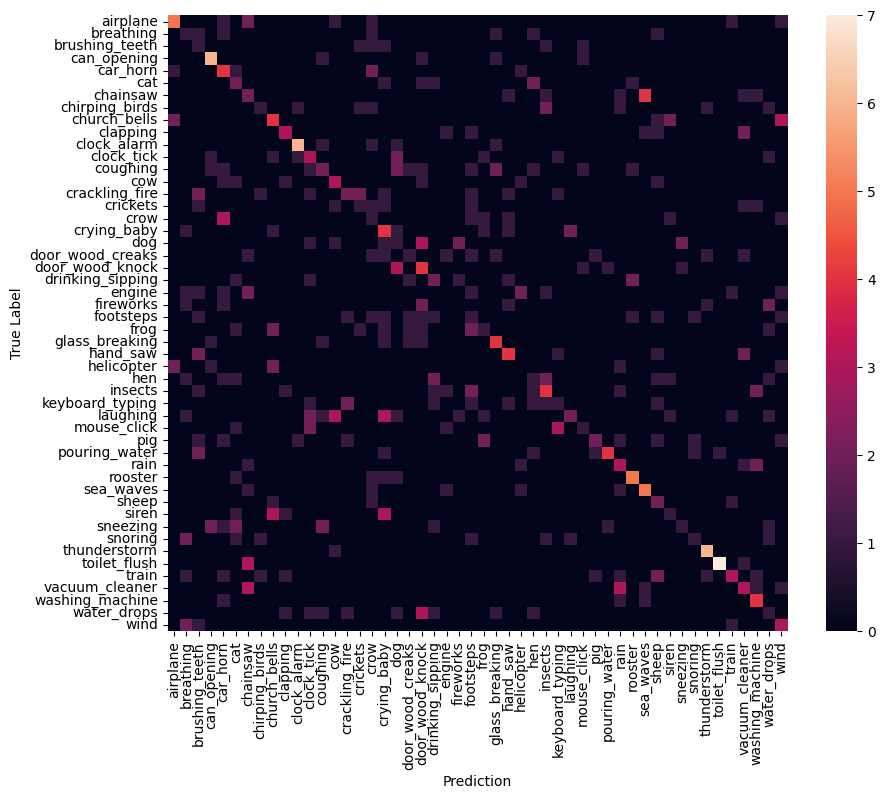

The most misclassified class is laughing
Audio category: laughing


The are more true laughing audio than the predicted ones:
Some laughing are classified as airplane, which is, for example:


In [36]:
# show only the best model

# Create the dataset
X = np.array(
    [encoder(np.expand_dims(x, axis=0)) for x, y in dataset_STFT.unbatch().take(2000)]
)
X = np.squeeze(X, axis=1)
y = np.array([y for x, y in dataset_STFT.unbatch().take(2000)])
y = np.argmax(y, axis=1)

# params
C = 0.001
kernel = "poly"
gamma = 0.01
degree = 2
test_size = 0.25
name_df = "ESC50"

# train test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=test_size, random_state=123
)

# fit the model
start_time = time.time()
model = SVC(C=C, kernel=kernel, random_state=123, degree=degree, gamma=gamma)
model.fit(X_train, y_train)

# accuracy on train and test
y_predict_train = model.predict(X_train)
y_predict_test = model.predict(X_test)
print(
    "Accuracy on train: {:.2f}%".format(accuracy_score(y_train, y_predict_train) * 100)
)
print("Accuracy on test: {:.2f}%".format(accuracy_score(y_test, y_predict_test) * 100))

# confusion matrix
labels50 = list(label_STFT.columns)
confusion_mtx = confusion_matrix(y_test, y_predict_test, labels50)

# listen to wrong audio
listen_to_wrong_audio(
    df_ESC50, y_test, y_predict_test, confusion_mtx=confusion_mtx, labels=labels50
)  # , n_audio = 2)

In [37]:
# model path
model_path = os.path.join(main_dir, "Saved_Models", Classifier_name)

# save the model
with open(model_path, "wb") as f:
    pickle.dump(model, f)

### MFCC input, flatten code

#### Create the dataset

In [25]:
batch_size = 30 if not strong_pc else 128
preprocessing = "MFCC"
n_dim = 3

dataset_MFCC, label_MFCC = create_dataset_lite(
    df_ESC50,
    batch_size=batch_size,
    preprocessing=preprocessing,
    ndim=n_dim,
    resize=True,
)

INPUT_DIM, n_labels = example_batch(
    dataset_MFCC, label_names=list(label_MFCC.columns), verbose=0, show_figure=True
)

Preprocessing: MFCC
Resizing with shape: 64x128


2023-09-09 20:23:48.981777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:23:48.981926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]


The max value is 367.3448181152344


2023-09-09 20:23:49.195199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [2000]
	 [[{{node Placeholder/_0}}]]
2023-09-09 20:23:49.195398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:23:49.616847: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input p

#### Load the encoder

In [26]:
AE_MFCC = "AE_Conv_prep_flatten_MFCC"
INPUT_DIM = (64, 128, 1)

path_to_AE = os.path.join(main_dir, "Saved_Models", AE_MFCC)

# import the autencoder
autoencoder = load_model(path_to_AE)
encoder = autoencoder.layers[1]

# freeze the encoder
encoder.trainable = False
encoder.summary()

Classifier_name = "SVM_encoder_classifier_flat_code_MFCC"

Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 32, 64, 16)        160       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 11, 22, 16)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 6, 11, 32)         4640      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 2, 4, 32)         0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 1, 2, 48)          13872     
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 1, 1, 48)         0   

#### Run a grid search to find the best params

In [27]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

In [97]:
# Create the dataset
X = np.array(
    [encoder(np.expand_dims(x, axis=0)) for x, y in dataset_MFCC.unbatch().take(2000)]
)
X = np.squeeze(X, axis=1)
y = np.array([y for x, y in dataset_MFCC.unbatch().take(2000)])
y = np.argmax(y, axis=1)

# Define the SVM model
svm = SVC()

# Define the hyperparameter grid
param_grid = {
    "C": [0.001, 0.01, 0.1, 1, 10, 100],
    "kernel": ["rbf", "poly", "sigmoid"],
    "degree": [2, 3, 4, 5],
    "gamma": ["scale", "auto", 0.001, 0.01, 0.1, 1, 10],
}

# Define the k-fold cross-validation strategy (e.g., 5-fold cross-validation)
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Create the GridSearchCV object with cross-validation
grid_search = GridSearchCV(
    estimator=svm, param_grid=param_grid, cv=kfold, scoring="accuracy"
)

# Fit the GridSearchCV object to your data
grid_search.fit(X, y)

# Access the best hyperparameters and the best SVM model
best_params = grid_search.best_params_
best_svm = grid_search.best_estimator_

# Print the best hyperparameters
print("Best Hyperparameters:", best_params)

# Evaluate the best SVM model using cross-validation or a separate test set
cv_results = cross_val_score(best_svm, X, y, cv=kfold, scoring="accuracy")
print(
    "Cross-Validation Accuracy: {:.2f}% (+/- {:.2f}%)".format(
        cv_results.mean() * 100, cv_results.std() * 100
    )
)

2023-09-02 19:32:55.008852: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [2000]
	 [[{{node Placeholder/_0}}]]
2023-09-02 19:32:55.009054: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [2000]
	 [[{{node Placeholder/_0}}]]
2023-09-02 19:33:27.702326: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,

Best Hyperparameters: {'C': 0.001, 'degree': 3, 'gamma': 10, 'kernel': 'poly'}
Cross-Validation Accuracy: 18.00% (+/- 1.30%)


2023-09-09 20:24:38.477489: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [2000]
	 [[{{node Placeholder/_0}}]]
2023-09-09 20:24:38.477736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [2000]
	 [[{{node Placeholder/_0}}]]
2023-09-09 20:24:41.778907: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [2000

Accuracy on train: 46.60%
Accuracy on test: 16.40%


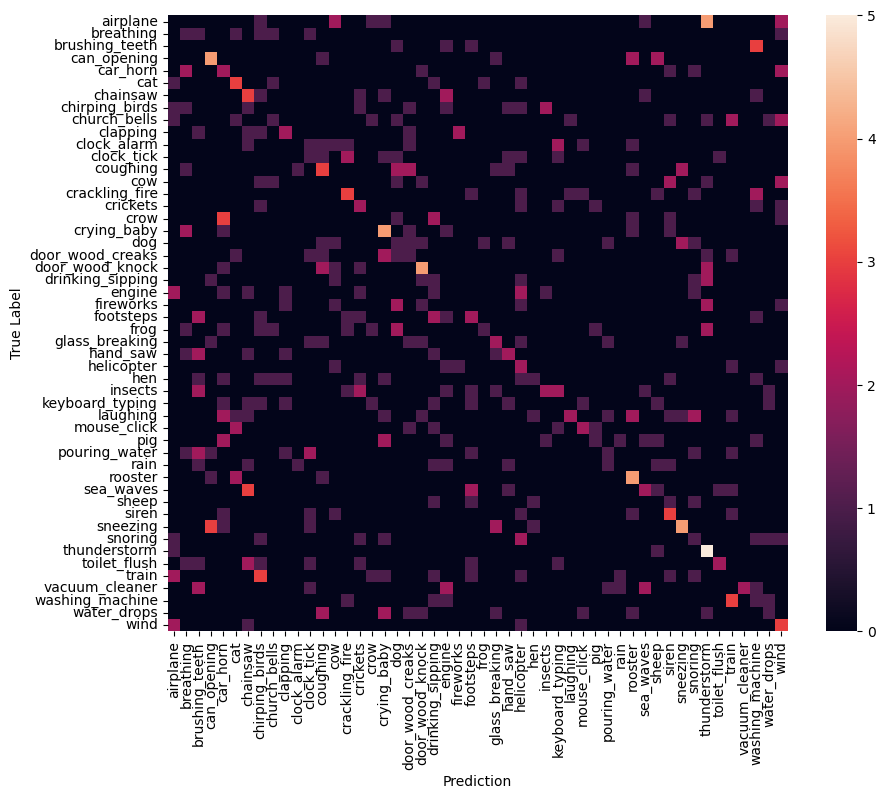

The most misclassified class is thunderstorm
Audio category: thunderstorm


The are more audio predicted as thunderstorm then actually is:
Audio category misclassified as thunderstorm: airplane


In [28]:
# show only the best model

# Create the dataset
X = np.array(
    [encoder(np.expand_dims(x, axis=0)) for x, y in dataset_STFT.unbatch().take(2000)]
)
X = np.squeeze(X, axis=1)
y = np.array([y for x, y in dataset_STFT.unbatch().take(2000)])
y = np.argmax(y, axis=1)

# params
C = 0.001
kernel = "poly"
gamma = 10
degree = 3
test_size = 0.25
name_df = "ESC50"

# train test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=test_size, random_state=123
)

# fit the model
start_time = time.time()
model = SVC(C=C, kernel=kernel, random_state=123, degree=degree, gamma=gamma)
model.fit(X_train, y_train)

# accuracy on train and test
y_predict_train = model.predict(X_train)
y_predict_test = model.predict(X_test)
print(
    "Accuracy on train: {:.2f}%".format(accuracy_score(y_train, y_predict_train) * 100)
)
print("Accuracy on test: {:.2f}%".format(accuracy_score(y_test, y_predict_test) * 100))

# confusion matrix
labels50 = list(label_STFT.columns)
confusion_mtx = confusion_matrix(y_test, y_predict_test, labels50)

# listen to wrong audio
listen_to_wrong_audio(
    df_ESC50, y_test, y_predict_test, confusion_mtx=confusion_mtx, labels=labels50
)  # , n_audio = 2)

In [29]:
# model path
model_path = os.path.join(main_dir, "Saved_Models", Classifier_name)

# save the model
with open(model_path, "wb") as f:
    pickle.dump(model, f)

### STFT input, flatten code, SSIM loss for the AE

#### Create the dataset

In [13]:
batch_size = 30 if not strong_pc else 128
preprocessing = "STFT"
n_dim = 3

dataset_STFT, label_STFT = create_dataset_lite(
    df_ESC50,
    batch_size=batch_size,
    preprocessing=preprocessing,
    ndim=n_dim,
    resize=True,
)

INPUT_DIM, n_labels = example_batch(
    dataset_STFT, label_names=list(label_STFT.columns), verbose=0, show_figure=True
)

Preprocessing: STFT
Resizing with shape: 64x128
The max value is 80.0


2023-09-09 20:05:21.185689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:05:21.185837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:05:21.248680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [

#### Load the encoder

In [18]:
from tensorflow.image import ssim


def ssim_loss(y_true, y_pred):
    return 1 - tf.reduce_mean(ssim(y_true, y_pred, max_val=1.0))

In [19]:
AE_STFT = "AE_Conv_prep_flatten_STFT_code_size_32_ssim"
INPUT_DIM = (64, 128, 1)

path_to_AE = os.path.join(main_dir, "Saved_Models", AE_STFT)

# import the autencoder
autoencoder = tf.keras.models.load_model(
    os.path.join(main_dir, "Saved_Models", AE_STFT),
    custom_objects={"ssim_loss": ssim_loss},
)
encoder = autoencoder.layers[1]

# freeze the encoder
encoder.trainable = False
encoder.summary()

Classifier_name = "SVM_encoder_classifier_flat_code_STFT_ssim"

Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 21, 42, 16)        160       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 7, 14, 16)        0         
 2D)                                                             
                                                                 
 flatten_6 (Flatten)         (None, 1568)              0         
                                                                 
 dense_12 (Dense)            (None, 32)                50208     
                                                                 
Total params: 50,368
Trainable params: 0
Non-trainable params: 50,368
_________________________________________________________________


#### Run a grid search to find the best params

In [20]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

In [21]:
# Create the dataset
X = np.array(
    [encoder(np.expand_dims(x, axis=0)) for x, y in dataset_STFT.unbatch().take(2000)]
)
X = np.squeeze(X, axis=1)
y = np.array([y for x, y in dataset_STFT.unbatch().take(2000)])
y = np.argmax(y, axis=1)

# Define the SVM model
svm = SVC()

# Define the hyperparameter grid
param_grid = {
    "C": [0.001, 0.01, 0.1, 1, 10, 100],
    "kernel": ["rbf", "poly", "sigmoid"],
    "degree": [2, 3, 4, 5],
    "gamma": ["scale", "auto", 0.001, 0.01, 0.1, 1, 10],
}

# Define the k-fold cross-validation strategy (e.g., 5-fold cross-validation)
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Create the GridSearchCV object with cross-validation
grid_search = GridSearchCV(
    estimator=svm, param_grid=param_grid, cv=kfold, scoring="accuracy"
)

# Fit the GridSearchCV object to your data
grid_search.fit(X, y)

# Access the best hyperparameters and the best SVM model
best_params = grid_search.best_params_
best_svm = grid_search.best_estimator_

# Print the best hyperparameters
print("Best Hyperparameters:", best_params)

# Evaluate the best SVM model using cross-validation or a separate test set
cv_results = cross_val_score(best_svm, X, y, cv=kfold, scoring="accuracy")
print(
    "Cross-Validation Accuracy: {:.2f}% (+/- {:.2f}%)".format(
        cv_results.mean() * 100, cv_results.std() * 100
    )
)

2023-09-09 20:06:19.536873: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:06:19.537187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [2000]
	 [[{{node Placeholder/_0}}]]
2023-09-09 20:06:21.908761: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [200

Best Hyperparameters: {'C': 10, 'degree': 5, 'gamma': 'scale', 'kernel': 'poly'}
Cross-Validation Accuracy: 23.95% (+/- 1.62%)


2023-09-09 20:21:00.741390: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:21:00.741808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-09 20:21:03.083430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [

Accuracy on train: 100.00%
Accuracy on test: 20.20%


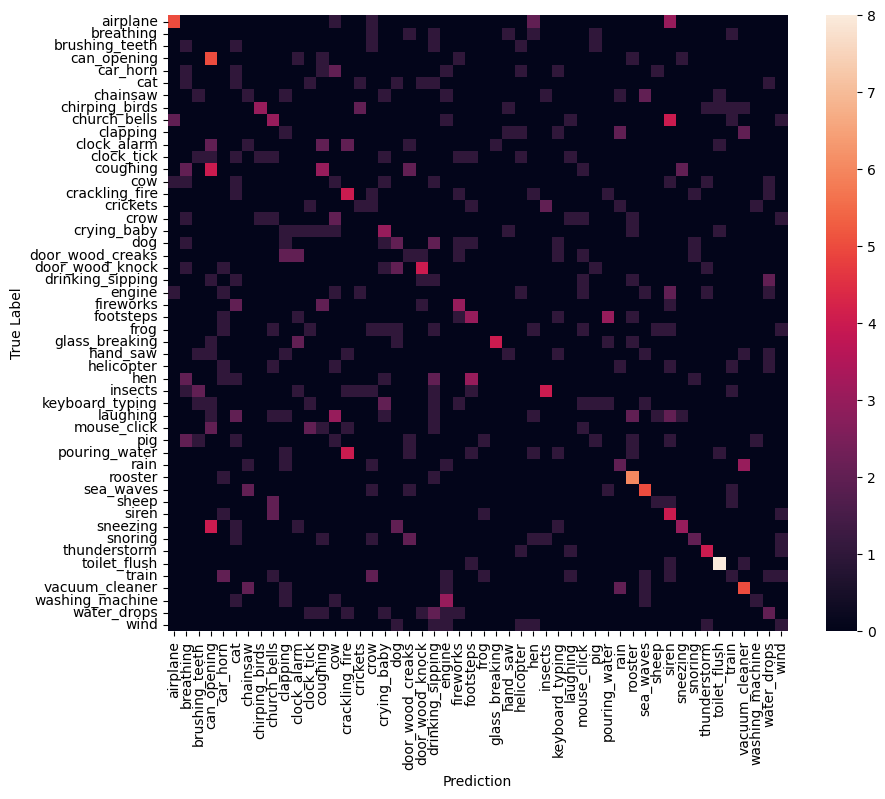

The most misclassified class is siren
Audio category: siren


The are more audio predicted as siren then actually is:
Audio category misclassified as siren: church_bells


In [23]:
# show only the best model

# Create the dataset
X = np.array(
    [encoder(np.expand_dims(x, axis=0)) for x, y in dataset_STFT.unbatch().take(2000)]
)
X = np.squeeze(X, axis=1)
y = np.array([y for x, y in dataset_STFT.unbatch().take(2000)])
y = np.argmax(y, axis=1)

# params
C = 10
kernel = "poly"
gammma = "scale"
degree = 5
test_size = 0.25
name_df = "ESC50"

# train test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=test_size, random_state=123
)

# fit the model
start_time = time.time()
model = SVC(C=C, kernel=kernel, random_state=123, degree=degree, gamma=gamma)
model.fit(X_train, y_train)

# accuracy on train and test
y_predict_train = model.predict(X_train)
y_predict_test = model.predict(X_test)
print(
    "Accuracy on train: {:.2f}%".format(accuracy_score(y_train, y_predict_train) * 100)
)
print("Accuracy on test: {:.2f}%".format(accuracy_score(y_test, y_predict_test) * 100))

# confusion matrix
labels50 = list(label_STFT.columns)
confusion_mtx = confusion_matrix(y_test, y_predict_test, labels50)

# listen to wrong audio
listen_to_wrong_audio(
    df_ESC50, y_test, y_predict_test, confusion_mtx=confusion_mtx, labels=labels50
)  # , n_audio = 2)

In [24]:
# model path
model_path = os.path.join(main_dir, "Saved_Models", Classifier_name)

# save the model
with open(model_path, "wb") as f:
    pickle.dump(model, f)

### STFT input, flatten code, Autoencoder trained on AudioSet database - classification on ESC-50

#### Create the dataset

In [12]:
batch_size = 30
preprocessing = "STFT"
n_dim = 3

dataset_STFT, label_STFT = create_dataset_lite(
    df_ESC50,
    batch_size=batch_size,
    preprocessing=preprocessing,
    ndim=n_dim,
    resize=True,
)

INPUT_DIM, n_labels = example_batch(
    dataset_STFT, label_names=list(label_STFT.columns), verbose=0, show_figure=True
)

Preprocessing: STFT
Resizing with shape: 64x128
The max value is 80.0


2023-09-10 20:14:09.102951: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-10 20:14:09.103091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-10 20:14:09.167218: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [

#### Load the encoder

In [13]:
AE_STFT = "AE_Conv_prep_flatten_STFT_AudioSet"
INPUT_DIM = (64, 128, 1)

path_to_AE = os.path.join(main_dir, "Saved_Models", AE_STFT)

# import the autencoder
autoencoder = load_model(path_to_AE)
encoder = autoencoder.layers[1]

# freeze the encoder
encoder.trainable = False
encoder.summary()

Classifier_name = "SVM_encoder_classifier_flat_code_STFT_AudioSet"

Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 21, 42, 16)        160       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 14, 16)        0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 1568)              0         
                                                                 
 dense_2 (Dense)             (None, 32)                50208     
                                                                 
Total params: 50,368
Trainable params: 0
Non-trainable params: 50,368
_________________________________________________________________


#### Run a grid search to find the best params

In [14]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

In [15]:
# Create the dataset
X = np.array(
    [encoder(np.expand_dims(x, axis=0)) for x, y in dataset_STFT.unbatch().take(2000)]
)
X = np.squeeze(X, axis=1)
y = np.array([y for x, y in dataset_STFT.unbatch().take(2000)])
y = np.argmax(y, axis=1)

# Define the SVM model
svm = SVC()

# Define the hyperparameter grid
"""param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'kernel': ['rbf', 'sigmoid', 'poly'],
    'degree': [2,3],
    'gamma': ['scale', 'auto', 0.001, 0.01, 0.1, 1, 10]
}"""

param_grid = {
    "C": [0.001, 0.01, 0.1, 1, 10, 100],
    "kernel": ["rbf", "sigmoid"],
    "gamma": ["scale", "auto", 0.001, 0.01, 0.1, 1, 10],
}

# Define the k-fold cross-validation strategy (e.g., 5-fold cross-validation)
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Create the GridSearchCV object with cross-validation
grid_search = GridSearchCV(
    estimator=svm, param_grid=param_grid, cv=kfold, scoring="accuracy", verbose=2
)

# Fit the GridSearchCV object to your data
grid_search.fit(X, y)

# Access the best hyperparameters and the best SVM model
best_params = grid_search.best_params_
best_svm = grid_search.best_estimator_

# Print the best hyperparameters
print("Best Hyperparameters:", best_params)

# Evaluate the best SVM model using cross-validation or a separate test set
cv_results = cross_val_score(best_svm, X, y, cv=kfold, scoring="accuracy")
print(
    "Cross-Validation Accuracy: {:.2f}% (+/- {:.2f}%)".format(
        cv_results.mean() * 100, cv_results.std() * 100
    )
)

2023-09-10 20:14:12.047940: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-10 20:14:12.048176: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-10 20:14:19.857530: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [

Fitting 5 folds for each of 84 candidates, totalling 420 fits
[CV] END ...................C=0.001, gamma=scale, kernel=rbf; total time=   0.2s
[CV] END ...................C=0.001, gamma=scale, kernel=rbf; total time=   0.2s
[CV] END ...................C=0.001, gamma=scale, kernel=rbf; total time=   0.2s
[CV] END ...................C=0.001, gamma=scale, kernel=rbf; total time=   0.2s
[CV] END ...................C=0.001, gamma=scale, kernel=rbf; total time=   0.2s
[CV] END ...............C=0.001, gamma=scale, kernel=sigmoid; total time=   0.2s
[CV] END ...............C=0.001, gamma=scale, kernel=sigmoid; total time=   0.2s
[CV] END ...............C=0.001, gamma=scale, kernel=sigmoid; total time=   0.2s
[CV] END ...............C=0.001, gamma=scale, kernel=sigmoid; total time=   0.2s
[CV] END ...............C=0.001, gamma=scale, kernel=sigmoid; total time=   0.2s
[CV] END ....................C=0.001, gamma=auto, kernel=rbf; total time=   0.2s
[CV] END ....................C=0.001, gamma=aut

2023-09-10 20:17:25.087396: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [2000]
	 [[{{node Placeholder/_0}}]]
2023-09-10 20:17:25.087721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-10 20:17:27.375778: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [200

Accuracy on train: 40.33%
Accuracy on test: 22.60%


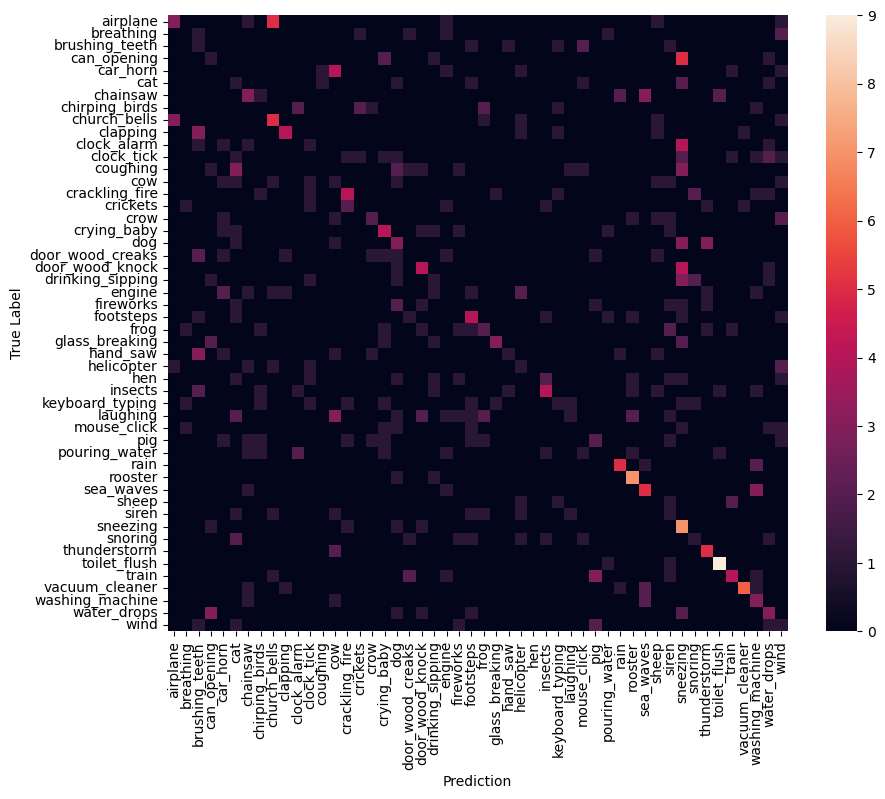

The most misclassified class is sneezing
Audio category: sneezing


The are more audio predicted as sneezing then actually is:
Audio category misclassified as sneezing: can_opening


In [18]:
# show only the best model

# Create the dataset
X = np.array(
    [encoder(np.expand_dims(x, axis=0)) for x, y in dataset_STFT.unbatch().take(2000)]
)
X = np.squeeze(X, axis=1)
y = np.array([y for x, y in dataset_STFT.unbatch().take(2000)])
y = np.argmax(y, axis=1)

# params
C = 100
kernel = "rbf"
gamma = "scale"
# degree = 2
test_size = 0.25
name_df = "ESC50"

# train test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=test_size, random_state=123
)

# fit the model
start_time = time.time()
model = SVC(C=C, kernel=kernel, random_state=123, gamma=gamma)  # , degree = degree)
model.fit(X_train, y_train)

# accuracy on train and test
y_predict_train = model.predict(X_train)
y_predict_test = model.predict(X_test)
print(
    "Accuracy on train: {:.2f}%".format(accuracy_score(y_train, y_predict_train) * 100)
)
print("Accuracy on test: {:.2f}%".format(accuracy_score(y_test, y_predict_test) * 100))

# confusion matrix
labels50 = list(label_STFT.columns)
confusion_mtx = confusion_matrix(y_test, y_predict_test, labels50)

# listen to wrong audio
listen_to_wrong_audio(
    df_ESC50, y_test, y_predict_test, confusion_mtx=confusion_mtx, labels=labels50
)  # , n_audio = 2)

In [20]:
# model path
model_path = os.path.join(main_dir, "Saved_Models", Classifier_name)

# save the model
with open(model_path, "wb") as f:
    pickle.dump(model, f)

### STFT input, flatten code, Autoencoder trained on ESC-50 Augmented database - classification on the original ESC-50 

#### Create the dataset

In [3]:
batch_size = 30
preprocessing = "STFT"
n_dim = 3

dataset_STFT, label_STFT = create_dataset_lite(
    df_ESC50,
    batch_size=batch_size,
    preprocessing=preprocessing,
    ndim=n_dim,
    resize=True,
)

INPUT_DIM, n_labels = example_batch(
    dataset_STFT, label_names=list(label_STFT.columns), verbose=0, show_figure=True
)

Preprocessing: STFT
Resizing with shape: 64x128


2023-09-11 00:53:27.062715: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-11 00:53:27.062862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-11 00:53:27.068548: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


The max value is 80.0


2023-09-11 00:53:27.765130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [2000]
	 [[{{node Placeholder/_0}}]]
2023-09-11 00:53:27.765328: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [2000]
	 [[{{node Placeholder/_0}}]]
2023-09-11 00:53:27.857658: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pip

#### Load the encoder

In [4]:
AE_STFT = "AE_Conv_prep_flatten_STFT_Augmented"
INPUT_DIM = (64, 128, 1)

path_to_AE = os.path.join(main_dir, "Saved_Models", AE_STFT)

# import the autencoder
autoencoder = load_model(path_to_AE)
encoder = autoencoder.layers[1]

# freeze the encoder
encoder.trainable = False
encoder.summary()

Classifier_name = "SVM_encoder_classifier_flat_code_STFT_AE_trained_on_Augmented"

Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 32, 64, 32)        832       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 16, 32, 32)       0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 16, 32, 32)        0         
                                                                 
 conv2d_6 (Conv2D)           (None, 8, 16, 64)         51264     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 4, 8, 64)         0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 4, 8, 64)          0   

#### Run a grid search to find the best params

In [5]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

Runniamo la grid search sul ESC-50 originale

In [6]:
# Create the dataset
X = np.array(
    [encoder(np.expand_dims(x, axis=0)) for x, y in dataset_STFT.unbatch().take(2000)]
)
X = np.squeeze(X, axis=1)
y = np.array([y for x, y in dataset_STFT.unbatch().take(2000)])
y = np.argmax(y, axis=1)

# Define the SVM model
svm = SVC()

# Define the hyperparameter grid
"""param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'kernel': ['rbf', 'sigmoid', 'poly'],
    'degree': [2,3],
    'gamma': ['scale', 'auto', 0.001, 0.01, 0.1, 1, 10]
}"""

param_grid = {
    "C": [0.001, 0.01, 0.1, 1, 10, 100],
    "kernel": ["rbf", "sigmoid"],
    "gamma": ["scale", "auto", 0.001, 0.01, 0.1, 1, 10],
}

# Define the k-fold cross-validation strategy (e.g., 5-fold cross-validation)
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Create the GridSearchCV object with cross-validation
grid_search = GridSearchCV(
    estimator=svm, param_grid=param_grid, cv=kfold, scoring="accuracy", verbose=2
)

# Fit the GridSearchCV object to your data
grid_search.fit(X, y)

# Access the best hyperparameters and the best SVM model
best_params = grid_search.best_params_
best_svm = grid_search.best_estimator_

# Print the best hyperparameters
print("Best Hyperparameters:", best_params)

# Evaluate the best SVM model using cross-validation or a separate test set
cv_results = cross_val_score(best_svm, X, y, cv=kfold, scoring="accuracy")
print(
    "Cross-Validation Accuracy: {:.2f}% (+/- {:.2f}%)".format(
        cv_results.mean() * 100, cv_results.std() * 100
    )
)

2023-09-11 00:53:43.454091: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-11 00:53:43.454343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-11 00:53:52.773823: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2

Fitting 5 folds for each of 84 candidates, totalling 420 fits
[CV] END ...................C=0.001, gamma=scale, kernel=rbf; total time=   0.2s
[CV] END ...................C=0.001, gamma=scale, kernel=rbf; total time=   0.2s
[CV] END ...................C=0.001, gamma=scale, kernel=rbf; total time=   0.2s
[CV] END ...................C=0.001, gamma=scale, kernel=rbf; total time=   0.2s
[CV] END ...................C=0.001, gamma=scale, kernel=rbf; total time=   0.2s
[CV] END ...............C=0.001, gamma=scale, kernel=sigmoid; total time=   0.2s
[CV] END ...............C=0.001, gamma=scale, kernel=sigmoid; total time=   0.2s
[CV] END ...............C=0.001, gamma=scale, kernel=sigmoid; total time=   0.2s
[CV] END ...............C=0.001, gamma=scale, kernel=sigmoid; total time=   0.2s
[CV] END ...............C=0.001, gamma=scale, kernel=sigmoid; total time=   0.2s
[CV] END ....................C=0.001, gamma=auto, kernel=rbf; total time=   0.2s
[CV] END ....................C=0.001, gamma=aut

#### Best model evaluation

2023-09-11 00:56:20.563608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-11 00:56:20.563804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype uint8 and shape [2000,50]
	 [[{{node Placeholder/_1}}]]
2023-09-11 00:56:25.339418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [

Accuracy on train: 47.67%
Accuracy on test: 22.80%


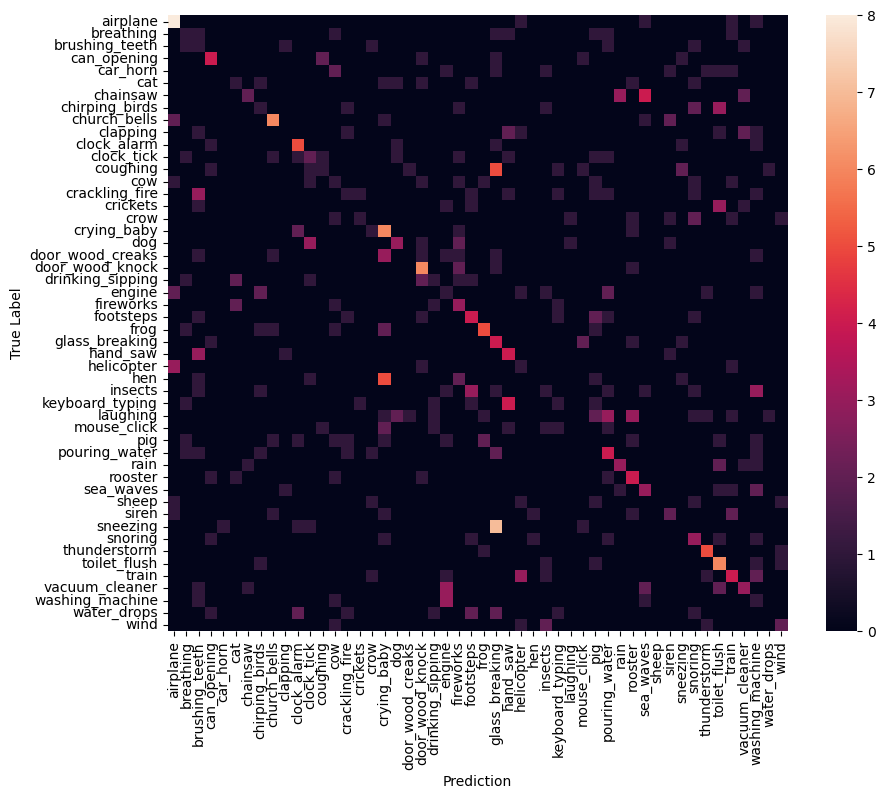

The most misclassified class is glass_breaking
Audio category: glass_breaking


The are more audio predicted as glass_breaking then actually is:
Audio category misclassified as glass_breaking: sneezing


In [9]:
# show only the best model

# Create the dataset
X = np.array(
    [encoder(np.expand_dims(x, axis=0)) for x, y in dataset_STFT.unbatch().take(2000)]
)
X = np.squeeze(X, axis=1)
y = np.array([y for x, y in dataset_STFT.unbatch().take(2000)])
y = np.argmax(y, axis=1)

# params
C = 10
kernel = "rbf"
gamma = 0.01
# degree = 2
test_size = 0.25
name_df = "ESC50"

# train test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=test_size, random_state=123
)

# fit the model
start_time = time.time()
model = SVC(C=C, kernel=kernel, random_state=123, gamma=gamma)  # , degree = degree)
model.fit(X_train, y_train)

# accuracy on train and test
y_predict_train = model.predict(X_train)
y_predict_test = model.predict(X_test)
print(
    "Accuracy on train: {:.2f}%".format(accuracy_score(y_train, y_predict_train) * 100)
)
print("Accuracy on test: {:.2f}%".format(accuracy_score(y_test, y_predict_test) * 100))

# confusion matrix
labels50 = list(label_STFT.columns)
confusion_mtx = confusion_matrix(y_test, y_predict_test, labels50)

# listen to wrong audio
listen_to_wrong_audio(
    df_ESC50, y_test, y_predict_test, confusion_mtx=confusion_mtx, labels=labels50
)  # , n_audio = 2)

In [10]:
# model path
model_path = os.path.join(main_dir, "Saved_Models", Classifier_name)

# save the model
with open(model_path, "wb") as f:
    pickle.dump(model, f)